### Aleksandr Belov
#### Final submit
- Part 4 was added

### You can download the `.pth` models [here](https://drive.google.com/open?id=1p9f6_b9lk1BsBZkT1QBU4f6KKYJpFwvh) and reproduce the results.

In [1]:
# Change it if necessary !
PATH_TO_YOUR_DIR = r"/content/drive/My Drive/Belov_Aleksandr_DL_HW3_Final"

try:
    import google.colab
    IN_COLAB = True
except ImportError:
    IN_COLAB = False

from pathlib import Path

if IN_COLAB:
    google.colab.drive.mount("/content/drive")
    AUX_DATA_ROOT = Path(PATH_TO_YOUR_DIR)

    assert AUX_DATA_ROOT.is_dir(), "Have you forgot to 'Add a shortcut to Drive'?"
else:
    AUX_DATA_ROOT = Path(".")

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


# Part 1. Segmentation — 10 points

### Task

Train a neural network to segment cells edges.

In this task, you won't be provided with any code snippets, just input data and target metric — intersection-over-union (IoU) (see the implementation below).

You should train your neural network to predict a mask of edge pixels (pixels in gt images with value greater than 0).

Use everything you have learnt by now: 
* any architectures for semantic segmentation (encoder-decoder like or based on dilated convolutions), we recommend using UNet: https://towardsdatascience.com/unet-line-by-line-explanation-9b191c76baf5)
* data augmentation (you will need that since train set consists of just 41 images)
* fine-tuning

You are not allowed to do only one thing: to train you network on a test set.

The final solution will consist of an ipython notebook with code (for final network training + any experiments with data) and an archive with png images with network predictions for test images (one-channel images, 0 - for non-edge pixels, any non-zero value for edge pixels).

A good network should be able to segment images with iou >= 0.29. This is not a strict criterion of full points solution, but try to obtain similar or better numbers.

Practical notes:
* There is a hard data class imbalance in dataset, so the network output will be biased toward "zero" class. You can either tune the minimal probability threshold for "edge" class, or add class weights to increase the cost of edge pixels in optimized loss.
* Dataset is small so actively use data augmentation: rotations, flip, random contrast and brightness
* Better spend time on experiments with neural network than on postprocessing tricks (i.e test set augmentation).
* Keep in mind that network architecture defines receptive field of pixel. If the size of network input is smaller than receptive field of output pixel, than probably you can throw some layers without loss of quality. It is ok to modify "of-the-shelf" architectures. 

Good luck!

In [2]:
### Download the dataset ###
!wget https://www.dropbox.com/s/jy34yowcf85ydba/data.zip?dl=0 -O data.zip
!unzip -q data.zip

--2020-08-14 14:19:27--  https://www.dropbox.com/s/jy34yowcf85ydba/data.zip?dl=0
Resolving www.dropbox.com (www.dropbox.com)... 162.125.3.1, 2620:100:6018:1::a27d:301
Connecting to www.dropbox.com (www.dropbox.com)|162.125.3.1|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /s/raw/jy34yowcf85ydba/data.zip [following]
--2020-08-14 14:19:27--  https://www.dropbox.com/s/raw/jy34yowcf85ydba/data.zip
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uca2464407c2249e12bc836f4376.dl.dropboxusercontent.com/cd/0/inline/A9fp2gaJea3-XsfQevK1QZj4R60TIBm5T7o2dbyZp4QSBsH84JZT3wtgd25S9KvAK0O7_gMXd7vBE_oMamjxQDcjvIBBh4ANQFcgYS8lH8OZkg/file# [following]
--2020-08-14 14:19:28--  https://uca2464407c2249e12bc836f4376.dl.dropboxusercontent.com/cd/0/inline/A9fp2gaJea3-XsfQevK1QZj4R60TIBm5T7o2dbyZp4QSBsH84JZT3wtgd25S9KvAK0O7_gMXd7vBE_oMamjxQDcjvIBBh4ANQFcgYS8lH8OZkg/file
Resolving uca2464407c2249e

In [3]:
### Target metric ###
def calc_iou(prediction, ground_truth):
    n_images = len(prediction)
    intersection, union = 0, 0
    for i in range(n_images):
        intersection += np.logical_and(prediction[i] > 0, ground_truth[i] > 0).astype(np.float32).sum() 
        union += np.logical_or(prediction[i] > 0, ground_truth[i] > 0).astype(np.float32).sum()
    return float(intersection) / union

In [4]:
# YOUR CODE HERE

In [5]:
import os
from time import time

import matplotlib.pyplot as plt
import numpy as np

from PIL import Image
from skimage.morphology import binary_dilation

In [6]:
import torch
import torch.nn as nn
from torch.optim import Adam
from torch.optim.lr_scheduler import MultiStepLR

from torch.utils.data import DataLoader, Dataset
import torchvision.transforms.functional as F

In [7]:
def calculate_mask_ratio(path_to_images, path_to_masks):

    dataset = ImageMaskDataSet(path_to_images, path_to_masks, transformation=False, mask_dilation=True)
    
    ratio = sum(mask.sum() for _, mask in dataset).type(torch.float32)
    ratio /= 512 * 512 * len(dataset)

    return ratio

In [8]:
class ImageMaskDataSet(Dataset):
    def __init__(self, path_to_images, path_to_masks=None, 
                 transformation=False, mask_dilation=False, seed=None):
        self.path_to_images = path_to_images
        self.path_to_masks = path_to_masks
        self.transformation = transformation
        self.mask_dilation = mask_dilation
        self.rng = np.random.RandomState(seed)

        self._image_exts = ['.jpg', '.jpeg', '.png', '.ppm', '.bmp', 
                            '.pgm', '.tif', '.tiff', '.webp'
                           ]
    
        self.image_paths = [path for path in os.listdir(self.path_to_images) if self._is_image(path)]
        self.image_paths = sorted(self.image_paths)

        if path_to_masks:
            self.mask_paths = [path for path in os.listdir(self.path_to_masks) if self._is_image(path)]
            assert len(self.image_paths) == len(self.mask_paths)
            self.mask_paths = sorted(self.mask_paths)
            self._are_the_same_names()

    def _is_image(self, path):
        return any(path.endswith(ext) for ext in self._image_exts)

    def _are_the_same_names(self):
        image_names = set([path.split('-')[0] for path in self.image_paths])
        mask_names = set([path.split('-')[0] for path in self.mask_paths])

        assert image_names == mask_names

    def __len__(self):
        return len(self.image_paths)

    def random_hflip(self, image, mask, p=0.5):
        if self.rng.rand() > p:
            image = F.hflip(image)
            mask = F.hflip(mask)

        return image, mask

    def random_vflip(self, image, mask, p=0.5):
        if self.rng.rand() > p:
            image = F.vflip(image)
            mask = F.vflip(mask)

        return image, mask

    def color_jitter(self, image, mask=None, brightness=0.15, contrast=0.15, saturation=0.15, hue=0.01):
        brightness = self.rng.uniform(max(0, 1-brightness), 1+brightness)
        image = F.adjust_brightness(image, brightness)

        contrast = self.rng.uniform(max(0, 1-contrast), 1+contrast)
        image = F.adjust_contrast(image, contrast)

        saturation = self.rng.uniform(max(0, 1-saturation), 1+saturation)
        image = F.adjust_saturation(image, saturation)

        hue = self.rng.uniform(-hue, hue)
        image = F.adjust_hue(image, hue)

        return image

    def random_rotate(self, image, mask, angle=45):
        angle = self.rng.uniform(-angle, angle)
        image = F.rotate(image, angle)
        mask = F.rotate(mask, angle)

        return image, mask

    def transform(self, image, mask):
        image = self.color_jitter(image)

        image, mask = self.random_vflip(image, mask)
        image, mask = self.random_hflip(image, mask)

        image, mask = self.random_rotate(image, mask)

        return image, mask

    def __getitem__(self, idx):
        image_path = os.path.join(self.path_to_images, self.image_paths[idx])
        image = Image.open(image_path)

        if self.path_to_masks:
            mask_path = os.path.join(self.path_to_masks, self.mask_paths[idx])
            mask = Image.open(mask_path)

        if self.transformation: 
            image, mask = self.transform(image, mask)

        if self.mask_dilation:
            mask = np.array(mask) > 0
            mask = binary_dilation(mask)

        image = F.to_tensor(image)
        mask = F.to_tensor(mask).type(torch.float32) if self.path_to_masks else torch.Tensor()

        return image, mask

In [9]:
class UnetModel(nn.Module):

    def __init__(self, d=64, input_c=3, output_c=1, batch_norm=True, dropout=True, mean=0, std=0.02):
        super().__init__()

        self.batch_norm = batch_norm
        self.dropout = dropout

        self.conv1 = nn.Conv2d(input_c, d, 3, padding=1)
        self.bn1 = nn.BatchNorm2d(d)
        self.conv2 = nn.Conv2d(d, d, 3, padding=1)
        self.bn2 = nn.BatchNorm2d(d)

        self.conv3 = nn.Conv2d(d, d * 2, 3, padding=1)
        self.bn3 = nn.BatchNorm2d(d * 2)
        self.conv4 = nn.Conv2d(d * 2, d * 2, 3, padding=1)
        self.bn4 = nn.BatchNorm2d(d * 2)

        self.conv5 = nn.Conv2d(d * 2, d * 4, 3, padding=1)
        self.bn5 = nn.BatchNorm2d(d * 4)
        self.conv6 = nn.Conv2d(d * 4, d * 4, 3, padding=1)
        self.bn6 = nn.BatchNorm2d(d * 4)

        self.conv7 = nn.Conv2d(d * 4, d * 8, 3, padding=1)
        self.bn7 = nn.BatchNorm2d(d * 8)
        self.conv8 = nn.Conv2d(d * 8, d * 8, 3, padding=1)
        self.bn8 = nn.BatchNorm2d(d * 8)

        self.conv_m1 = nn.Conv2d(d * 8, d * 16, 3, padding=1)
        self.bn_m1 = nn.BatchNorm2d(d * 16)
        self.conv_m2 = nn.Conv2d(d * 16, d * 16, 3, padding=1)
        self.bn_m2 = nn.BatchNorm2d(d * 16)

        self.conv_tr1 = nn.ConvTranspose2d(d * 16, d * 8, 2, stride=2)
        self.uconv8 = nn.Conv2d(d * 16, d * 8, 3, padding=1)
        self.ubn8 = nn.BatchNorm2d(d * 8)
        self.uconv7 = nn.Conv2d(d * 8, d * 8, 3, padding=1)
        self.ubn7 = nn.BatchNorm2d(d * 8)

        self.conv_tr2 = nn.ConvTranspose2d(d * 8, d * 4, 2, stride=2)
        self.uconv6 = nn.Conv2d(d * 8, d * 4, 3, padding=1)
        self.ubn6 = nn.BatchNorm2d(d * 4)
        self.uconv5 = nn.Conv2d(d * 4, d * 4, 3, padding=1)
        self.ubn5 = nn.BatchNorm2d(d * 4)

        self.conv_tr3 = nn.ConvTranspose2d(d * 4, d * 2, 2, stride=2)
        self.uconv4 = nn.Conv2d(d * 4, d * 2, 3, padding=1)
        self.ubn4 = nn.BatchNorm2d(d * 2)
        self.uconv3 = nn.Conv2d(d * 2, d * 2, 3, padding=1)
        self.ubn3 = nn.BatchNorm2d(d * 2)

        self.conv_tr4 = nn.ConvTranspose2d(d * 2, d, 2, stride=2)
        self.uconv2 = nn.Conv2d(d * 2, d, 3, padding=1)
        self.ubn2 = nn.BatchNorm2d(d)
        self.uconv1 = nn.Conv2d(d, d, 3, padding=1)
        self.ubn1 = nn.BatchNorm2d(d)

        self.conv_out = nn.Conv2d(d, output_c, 1)

        self._weight_init(mean, std) 

    def _weight_init(self, mean, std):
        for m in self._modules:
            module = self._modules[m]
            if isinstance(module, (nn.ConvTranspose2d, nn.Conv2d)):
                module.weight.data.normal_(mean, std)
                module.bias.data.zero_()

    def forward(self, input):
        e1 = self.conv1(input)
        e1 = self.bn1(torch.relu(e1)) if self.batch_norm else torch.relu(e1)
        e1 = self.conv2(e1)
        e1 = self.bn2(torch.relu(e1)) if self.batch_norm else torch.relu(e1)
        x = torch.max_pool2d(e1, 2)
        if self.dropout:
            x = torch.dropout(x, 0.25, self.training)

        e2 = self.conv3(x)
        e2 = self.bn3(torch.relu(e2)) if self.batch_norm else torch.relu(e2)
        e2 = self.conv4(e2)
        e2 = self.bn4(torch.relu(e2)) if self.batch_norm else torch.relu(e2)
        x = torch.max_pool2d(e2, 2)
        if self.dropout:
            x = torch.dropout(x, 0.5, self.training)

        e3 = self.conv5(x)
        e3 = self.bn5(torch.relu(e3)) if self.batch_norm else torch.relu(e3)
        e3 = self.conv6(e3)
        e3 = self.bn6(torch.relu(e3)) if self.batch_norm else torch.relu(e3)
        x = torch.max_pool2d(e3, 2)
        if self.dropout:
            x = torch.dropout(x, 0.5, self.training)

        e4 = self.conv7(x)
        e4 = self.bn7(torch.relu(e4)) if self.batch_norm else torch.relu(e4)
        e4 = self.conv8(e4)
        e4 = self.bn8(torch.relu(e4)) if self.batch_norm else torch.relu(e4)
        x = torch.max_pool2d(e4, 2)
        if self.dropout:
            x = torch.dropout(x, 0.5, self.training)

        x = self.conv_m1(x)
        x = self.bn_m1(torch.relu(x)) if self.batch_norm else torch.relu(x)
        x = self.conv_m2(x)
        x = self.bn_m2(torch.relu(x)) if self.batch_norm else torch.relu(x)

        x = self.conv_tr1(x)
        x = torch.cat([x, e4], 1)
        if self.dropout:
            x = torch.dropout(x, 0.5, self.training)
        x = self.uconv8(x)
        x = self.ubn8(torch.relu(x)) if self.batch_norm else torch.relu(x)
        x = self.uconv7(x)
        x = self.ubn7(torch.relu(x)) if self.batch_norm else torch.relu(x)

        x = self.conv_tr2(x)
        x = torch.cat([x, e3], 1)
        if self.dropout:
            x = torch.dropout(x, 0.5, self.training)
        x = self.uconv6(x)
        x = self.ubn6(torch.relu(x)) if self.batch_norm else torch.relu(x)
        x = self.uconv5(x)
        x = self.ubn5(torch.relu(x)) if self.batch_norm else torch.relu(x)

        x = self.conv_tr3(x)
        x = torch.cat([x, e2], 1)
        if self.dropout:
            x = torch.dropout(x, 0.5, self.training)
        x = self.uconv4(x)
        x = self.ubn4(torch.relu(x)) if self.batch_norm else torch.relu(x)
        x = self.uconv3(x)
        x = self.ubn3(torch.relu(x)) if self.batch_norm else torch.relu(x)

        x = self.conv_tr4(x)
        x = torch.cat([x, e1], 1)
        if self.dropout:
            x = torch.dropout(x, 0.5, self.training)
        x = self.uconv2(x)
        x = self.ubn2(torch.relu(x)) if self.batch_norm else torch.relu(x)
        x = self.uconv1(x)
        x = self.ubn1(torch.relu(x)) if self.batch_norm else torch.relu(x)

        x = self.conv_out(x)
        #x = torch.sigmoid(x)

        return x

In [10]:
def train_step(net, train_loader, criterion, optimizer):
    train_losses = []
    scores = []
    net.train()

    for X, y in train_loader:
        X = X.to(device)
        y = y.to(device)

        pred = net(X)
        loss = criterion(pred, y)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        train_losses.append(loss.item())

        iou = calc_iou(pred.cpu().detach().numpy() > 0,
                       y.cpu().detach().numpy()
                       )
        scores.append(iou)

    loss = sum(train_losses) / len(train_losses)
    score = sum(scores) / len(scores)

    return loss, score


def eval(net, val_loader, criterion):
    val_losses = []
    scores = []
    net.eval()

    for X, y in val_loader:
        X = X.to(device)
        y = y.to(device)

        pred = net(X)
        loss = criterion(pred, y)

        val_losses.append(loss.item())

        iou = calc_iou(pred.cpu().detach().numpy() > 0,
                       y.cpu().detach().numpy()
                       )
        scores.append(iou)

    loss = sum(val_losses) / len(val_losses)
    score = sum(scores) / len(scores)

    return loss, score


def train(epochs, net, criterion, optimizer, train_loader, val_loader,
          scheduler=None, verbose=True, save_dir=None, log_file=None, board_dir=None, label='model'):

    print(f'Model dir: {save_dir}', end='\n\n')

    net.to(device)
    best_val_score = 0
    losses = {'train': [], 'val': []}
    scores = {'train': [], 'val': []}

    for epoch in range(1, epochs+1):
        t = time()
        train_loss, train_score = train_step(net, train_loader, criterion, optimizer)
        val_loss, val_score = eval(net, val_loader, criterion)

        losses['train'].append(train_loss)
        losses['val'].append(val_loss)
        scores['train'].append(train_score)
        scores['val'].append(val_score)


        if scheduler is not None:
            scheduler.step()

        if save_dir:
            path_to_model = os.path.join(save_dir, f'{label}_last.pth')
            torch.save(net.state_dict(), path_to_model)

            if best_val_score < val_score:
                best_val_score = val_score
                path_to_best_model = os.path.join(save_dir, f'{label}_best.pth')
                torch.save(net.state_dict(), path_to_best_model)

        lr = optimizer.param_groups[0]['lr']
        log_line =  f'{epoch}/{epochs} || LR: {lr:.5f} | ' + \
                    f'Train:  Loss {train_loss:.4f} Score: {train_score:.4f} || ' + \
                    f'Val: Loss {val_loss:.4f} Score: {val_score:.4f} || {time()-t:.1f} sec'

        if verbose:
            print(log_line)

        if log_file:
            with open(log_file, 'a') as f:
                f.write(log_line + '\n')

    return losses, scores

In [11]:
PATH_TO_IMAGES = 'BBBC018_v1_images-fixed'
PATH_TO_MASKS = 'BBBC018_v1_outlines'

PATH_TO_TRAIN_IMAGES = os.path.join(PATH_TO_IMAGES, 'train')
PATH_TO_VAL_IMAGES = os.path.join(PATH_TO_IMAGES, 'val')

PATH_TO_TRAIN_MASKS = os.path.join(PATH_TO_MASKS, 'train')
PATH_TO_VAL_MASKS = os.path.join(PATH_TO_MASKS, 'val')

PATH_TO_MODELS = os.path.join(AUX_DATA_ROOT, 'models')

RANDOM_STATE = 42
DO_TRAIN = False

In [12]:
os.makedirs(PATH_TO_MODELS, exist_ok=True)

In [13]:
torch.manual_seed(RANDOM_STATE)

train_dataset = ImageMaskDataSet(PATH_TO_TRAIN_IMAGES, PATH_TO_TRAIN_MASKS, 
                                 transformation=True, mask_dilation=True, seed=RANDOM_STATE
                                 )
val_dataset = ImageMaskDataSet(PATH_TO_VAL_IMAGES, PATH_TO_VAL_MASKS)

train_loader = DataLoader(train_dataset, batch_size=2, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=1)

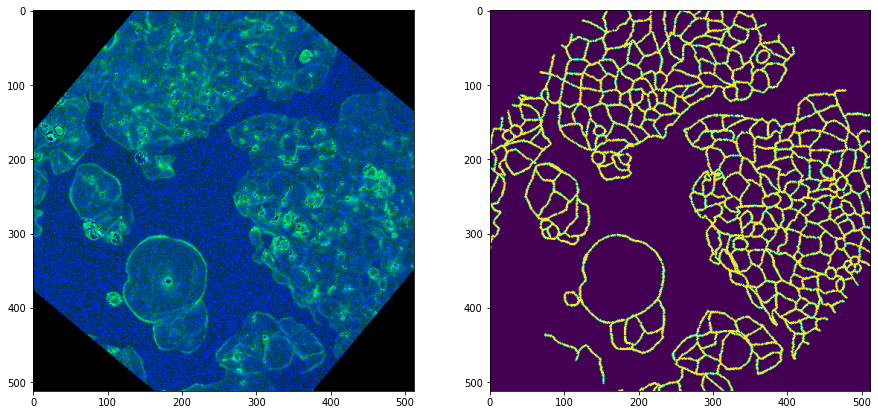

In [14]:
for img, mask in train_loader:
    fig, axis = plt.subplots(1, 2, figsize=(15, 12))
    axis[0].imshow(img[0].transpose(0, 2).transpose(0, 1))
    axis[1].imshow(mask[0, 0])

    break

In [15]:
start_filters = 64
model_name = f'unet_segm_{start_filters}'

if DO_TRAIN:
    torch.manual_seed(RANDOM_STATE)

    device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
    print('Device:', device)

    mask_ratio = calculate_mask_ratio(PATH_TO_TRAIN_IMAGES, PATH_TO_TRAIN_MASKS)
    pos_weight = (1 - mask_ratio) / mask_ratio
    pos_weight = pos_weight.to(device)
    print('Ratio of non-zero pixels to all pixels:', mask_ratio)
    print('Positive weight:', pos_weight)

    unet = UnetModel(start_filters)
    criterion = nn.BCEWithLogitsLoss(pos_weight=pos_weight)

    optimizer = Adam(unet.parameters(), lr=0.001, weight_decay=1e-5)
    scheduler = MultiStepLR(optimizer, (20, 40, 60, 80), gamma=0.3)

    print('Number of trainable parameters:', sum(p.numel() for p in unet.parameters() if p.requires_grad))

In [ ]:
unet = UnetModel(start_filters)
print('Number of trainable parameters:', sum(p.numel() for p in unet.parameters() if p.requires_grad))

In [ ]:
if DO_TRAIN:
    save_dir = os.path.join(PATH_TO_MODELS, model_name)
    log_file = os.path.join(save_dir, 'log')
    os.makedirs(save_dir, exist_ok=True)

    with open(log_file, 'w') as f:
        f.write(str(unet) + '\n\n')
        f.write(str(optimizer) + '\n\n')
        f.write(str())

    epochs = 100

In [ ]:
%%time

if DO_TRAIN:
    losses, scores = train(epochs, unet, criterion, optimizer, train_loader, val_loader, 
                           scheduler, save_dir=save_dir, log_file=log_file, label=model_name)

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 6.44 µs


In [ ]:
def get_numpy_data(model, data_loader):
    preds = []
    images = []
    masks = []

    for X, y in data_loader:
        pred = model(X)
        pred = torch.sigmoid(pred)

        images.append(X.transpose(1, 3).transpose(1, 2).numpy())
        preds.append(pred.detach().numpy())

        if y.nelement():
            masks.append(y.numpy())

    images = np.concatenate(images)
    preds = np.concatenate(preds)

    if masks:
        masks = np.concatenate(masks)

    return images, masks, preds

In [ ]:
path_to_unet = os.path.join(PATH_TO_MODELS, model_name, f'{model_name}_last.pth')
unet_params = torch.load(path_to_unet, map_location='cpu')

unet = UnetModel(start_filters)
unet.load_state_dict(unet_params)
unet.eval();

In [ ]:
thresholds = np.linspace(0, 1, 100)

scores = []
images, masks, preds = get_numpy_data(unet, val_loader)

for th in thresholds:
    pred_th = preds > th
    scores.append(calc_iou(pred_th, masks))

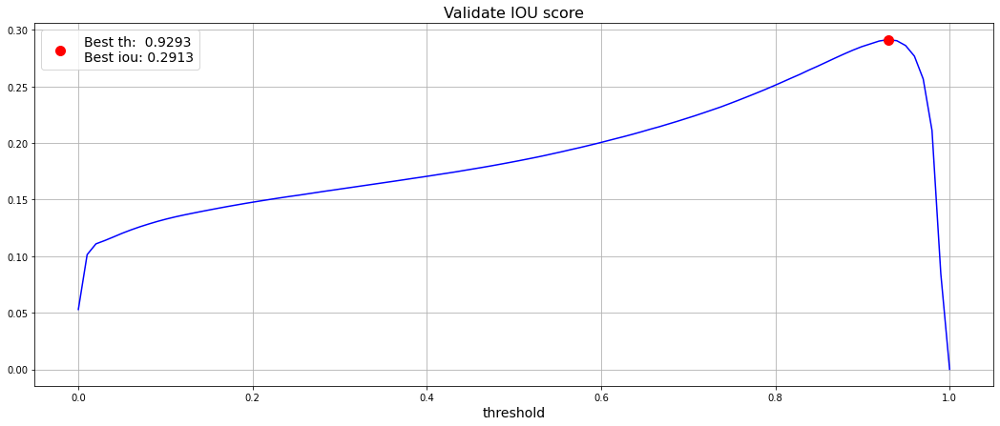

In [ ]:
plt.figure(figsize=(18, 7))
plt.plot(thresholds, scores, 'b')

i_max = np.argmax(scores)
plt.plot(thresholds[i_max], scores[i_max], 'ro', markersize=10, 
         label=f'Best th:  {thresholds[i_max]:.4f}\nBest iou: {scores[i_max]:.4f}')
plt.legend(loc='best', fontsize=14)
plt.xlabel('threshold', fontsize=14)
plt.title('Validate IOU score', fontsize=16)

plt.grid()
plt.show()

best_th = thresholds[i_max]

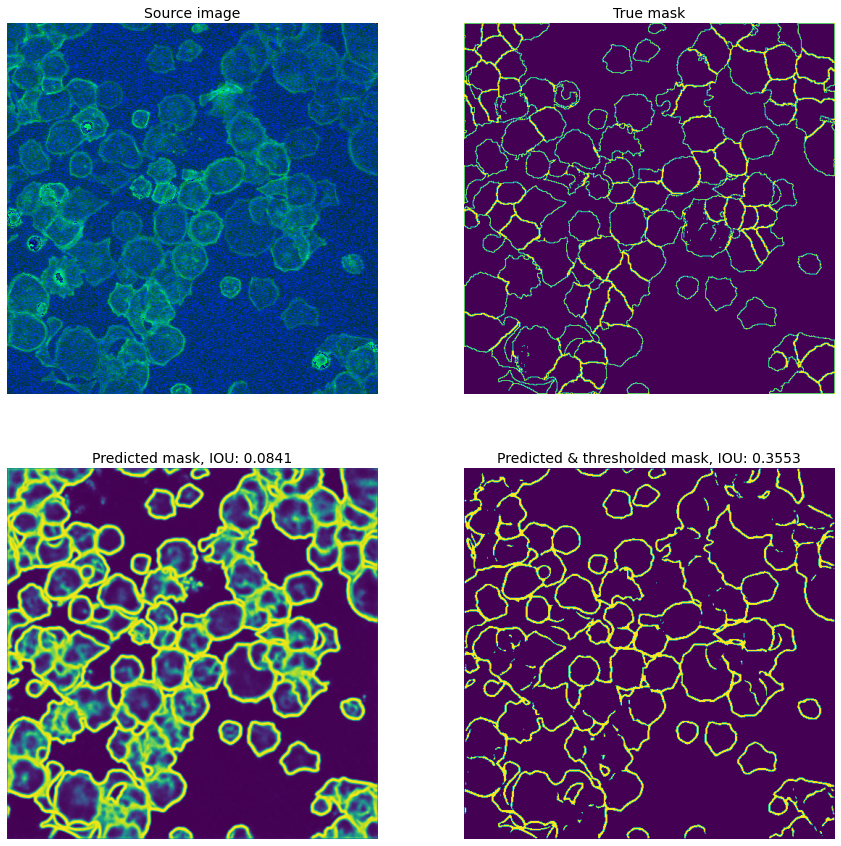

In [ ]:
n = 0 #np.random.randint(0, len(val_dataset))

fig, axis = plt.subplots(2, 2, figsize=(15, 15))

image = images[n]
mask = masks[n, 0]
pred = preds[n, 0]

axis[0, 0].imshow(image)
axis[0, 0].set_title('Source image', fontsize=14)
axis[0, 0].axis('off')

axis[0, 1].imshow(mask)
axis[0, 1].set_title('True mask', fontsize=14)
axis[0, 1].axis('off')

axis[1, 0].imshow(pred)
axis[1, 0].set_title(f'Predicted mask, IOU: {calc_iou(pred, mask):.4f}', fontsize=14)
axis[1, 0].axis('off')

pred_th = pred > best_th
axis[1, 1].imshow(pred_th)
axis[1, 1].set_title(f'Predicted & thresholded mask, IOU: {calc_iou(pred_th, mask):.4f}', fontsize=14)
axis[1, 1].axis('off')

plt.show()

## Test the model 

In [ ]:
path_to_unet = os.path.join(PATH_TO_MODELS, model_name, f'{model_name}_last.pth')
unet_params = torch.load(path_to_unet, map_location='cpu')

unet = UnetModel(start_filters)
unet.load_state_dict(unet_params)
unet.eval();

In [ ]:
PATH_TO_TEST_IMAGES = os.path.join(PATH_TO_IMAGES, 'test')
PATH_TO_TEST_MASKS = None # os.path.join(PATH_TO_MASKS, 'test') # !! Change it !!
best_th = 0.9293

test_dataset = ImageMaskDataSet(PATH_TO_TEST_IMAGES, PATH_TO_TEST_MASKS)
test_loader = DataLoader(test_dataset, batch_size=1)

images, masks, preds = get_numpy_data(unet, test_loader)

assert len(masks), 'Add path to test masks' 
print(f'Test IOU: {calc_iou(preds > best_th, masks):.4f}')

AssertionError: ignored

## Significant improvements
- The most significant improvement is the morphology transformation(dilation) of the train mask. This gave an increase of IOU $\approx 3.2$;
- Without augmentation, of course, it was also necessary for such a small dataset. For this type of image, you can use horizontal and vertical flips, well as random turns up to 45 degrees;
- To calculate weights in `BCEWithLogitsLoss` the ratio of non zero values to zero values in train dataset was calculated using the morphology transformation(dilation).

# Part 2. Deep Image Prior (DIP) — 10 points


### Theory

Deep Image Prior [1] can be viewed as an implicit conditional generative model:

\begin{equation}
p(x \mid x_0) = \int p(x \mid \theta, \mathcal{z}, x_0)\, p(\theta \mid x_0)\, p(\mathcal{z})\,d\theta\,d\mathcal{z}\,,
\end{equation}

Latent parameters of this model consist of the weights of the neural network $\theta$ and a fixed input $\mathcal{z}$, which is fed into the network. 

If we denote the network by $f$, the output $x$ is produced in the following way:

$$
x = f_\theta(\mathcal{z}).
$$

This this model is implicit: we cannot evaluate the integral above. In the case of DIP, both likelihood and prior are unknown. But, as with all implicit models, we can perform sampling from $p(x \mid x_0)$.

Similarly to style transfer models, the sampling is done via optimization. The algorithm is following:

1. Sample a data point $x_0$ from a data distribution.
2. Initialize $\theta$ with $\theta_0$ and $\mathcal{z}$ with $z$.
3. Perform an optimization of some error function $E$ with respect to the weights of the neural network: 

$$
\min_\theta E(f_\theta(z), x_0).
$$

4. Hand-pick the weights $\theta_M$ at intermediate optimization step $M$ and denote them as $\theta^*$

Now, the most counter-intuitive thing about this model is the fact that it can be used for image restoration (inpainting, denoising) and super-resolution. In this case, $x_0$ is a degraded version of a target image $x$. And, by trying to predict this degraded image using a network (via minimization of an error between the predicted image $f_\theta(z)$ and $x_0$) at some optimization step $M$ we will obtain its restored or upscaled version.

The main trick is that instead of optimizing with respect to an input tensor $z$, like in style-transfer models, we keep the input fixed and optimize with repect to the weights of the network. Brief explanation of this result is provided below, for more details please refer to [1].

On one hand, a convolutional neural network is close to a universal functional approximator, and, given enough training iterations, it can fit a manifold of arbitrary complexity [2]. On the other hand, it is observed in practice that early stopping leads to solutions with good generalization (same networks, as in [2], can be properly trained to achieve good generalization). In DIP paper this phenomena is explored for image synthesis, and it was shown that the same intuition about generalization also applies here. Remarkably though, the generalization results were obtained for a highly complex manifold of natural images, which once again shows how well-suited are convolutional neural networks for image processing and synthesis.

### Task

The general goal of the task is for you to reproduce the results from the paper:

using a Mean Square Error (MSE) as an error function,

1. perform denoising of the images in the folder "data/denoising",
2. perform inpaiting of the images in the folder "data/inpaiting" (for inpainting, apply the loss only over the known area of the image using a provided mask),

with a UNet-style network (with 4 downsampling layers, and 16, 32, 64 and 128 filters at the end of each block).

For architecture reference, please read this blog post:
https://towardsdatascience.com/unet-line-by-line-explanation-9b191c76baf5.

If you have used a UNet-style network in the first part of the assignment on segmentation, you can reuse the code.

### Notes

- You have to play with the number of iterations $M$ used for early stopping, and use the optimal value to denoise and inpaint the images from the task. For each task you may need to find different optimal values. The source code and the results of your experiments should be provided in this notebook.
- Use Adam as your default optimizer, but feel free to experiment with the other optimizers or even architectures of the network. The most thorough experiments will be graded with bonus points. The final score for the homework is calculated as $\min ( \text{points} + \text{bonus_points}, \text{max_points} ) $.

### References

[1] Ulyanov et. al., "Deep Image Prior", CVPR 2018, https://arxiv.org/abs/1711.10925

[2] Zhang et. al., "Understanding deep learning requires rethinking generalization", ICLR 2017, https://arxiv.org/abs/1611.03530

In [ ]:
### Download the dataset ###
!wget https://www.dropbox.com/s/si5o4dp4qa59cyy/data.zip?dl=0 -O data.zip
!unzip -q data.zip

--2020-05-12 19:47:21--  https://www.dropbox.com/s/si5o4dp4qa59cyy/data.zip?dl=0
Resolving www.dropbox.com (www.dropbox.com)... 162.125.3.1, 2620:100:6016:1::a27d:101
Connecting to www.dropbox.com (www.dropbox.com)|162.125.3.1|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /s/raw/si5o4dp4qa59cyy/data.zip [following]
--2020-05-12 19:47:22--  https://www.dropbox.com/s/raw/si5o4dp4qa59cyy/data.zip
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uc697e402a007d7c6ff475ebc916.dl.dropboxusercontent.com/cd/0/inline/A3lrJNBkMXk3ElFKr3NyjOCbuY4c6sIX_8-iaheQb01QKlgZgDtAV1tGUEMNhHagoxXD3NT1Uuf6HGLzZaKF_G-4n8WbMeGlR3Otvqss9erxEUEbF0vdOv1i-q_w7E4voak/file# [following]
--2020-05-12 19:47:22--  https://uc697e402a007d7c6ff475ebc916.dl.dropboxusercontent.com/cd/0/inline/A3lrJNBkMXk3ElFKr3NyjOCbuY4c6sIX_8-iaheQb01QKlgZgDtAV1tGUEMNhHagoxXD3NT1Uuf6HGLzZaKF_G-4n8WbMeGlR3Otvqss9erxEUEbF0vdOv1i-

In [ ]:
# YOUR CODE HERE

In [ ]:
import os
import numpy as np

import matplotlib.pyplot as plt
from skimage.io import imread
from skimage.transform import resize
from skimage.metrics import peak_signal_noise_ratio

In [ ]:
import torch
import torch.nn as nn
from torch.optim import Adam, SGD, RMSprop
from torch.optim.lr_scheduler import StepLR

from torchvision.transforms import ToTensor

In [ ]:
PATH_TO_DENOSING = 'data/denoising'
PATH_TO_INPAINTING = 'data/inpainting'
PATH_TO_MODELS = os.path.join(AUX_DATA_ROOT, 'models')

RANDOM_STATE = 42
DO_TRAIN = False

In [ ]:
os.makedirs(PATH_TO_MODELS, exist_ok=True)

In [ ]:
def load_images(paths, binary=False, scaling=False):
    images = [imread(path, as_gray=binary) for path in paths]
    if scaling:
        images = [image.astype(np.float32) / 255 for image in images]

    images = [preprocess_for_unet(image) for image in images]

    if binary:
        images = [image.astype(bool) for image in images]
    return images


def load_denosing_images(path):
    files = [os.path.join(path, file) for file in os.listdir(path)]
    return load_images(sorted(files), scaling=True)


def load_inpainting_images(path):
    files = [os.path.join(path, file) for file in os.listdir(path)]
    images = [f for f in files if 'mask' not in f]
    masks = [f for f in files if 'mask' in f]

    images = load_images(sorted(images), scaling=True)
    masks = load_images(sorted(masks), binary=True)

    return images, masks


def noise_image(image, std=0.01):
    noised_image = image + np.random.normal(0, std, image.shape)
    return np.clip(noised_image, 0, 1).astype(np.float32)

  
def plot_images(images, titles=None, figsize=(10, 7)):
    fig, axis = plt.subplots(1, len(images), figsize=figsize)

    for ax, image in zip(axis, images):
        ax.imshow(image)

    titles = titles if titles else []
    for ax, title in zip(axis, titles):
        ax.set_title(title, fontsize=14)

    plt.show()


def preprocess_for_unet(image):
    h, w = image.shape[:2]
    if h % 2**4:
        h -= h % 2**4
    if w % 2**4:
        w -= w % 2**4

    return resize(image, (h, w))

In [ ]:
def uniform(*size, params=None):
    a, b = params if params else (0, 1)
    return (a - b) * torch.rand(*size, dtype=torch.float32) + b


def normal(*size, mean=0, std=1):
    return mean + std * torch.randn(*size, dtype=torch.float32)


def get_denoise_input(images, n_channels=3, params=None):
    original_image, noised_image = images
    noised_tensor = ToTensor()(noised_image).type(torch.float32)
    noised_tensor = noised_tensor.unsqueeze(0)

    h, w = original_image.shape[:2]
    noise_input = uniform(1, n_channels, h, w, params=params)

    return original_image, noised_image, noised_tensor, noise_input


def tensor_to_np_image(tensor_image):
    tensor_image = tensor_image[0].transpose(0, 2).transpose(0, 1)
    np_image = tensor_image.cpu().detach().numpy()

    return np_image


def reconstruct_image(denoising_dir, model_name, get_input):
    torch.manual_seed(RANDOM_STATE)
    label, noise_channels, unet_start_filters, lr, a, b = model_name.replace('.pth', '').split('_')
    noise_channels, unet_start_filters = int(noise_channels), int(unet_start_filters)
    lr = float(lr)
    uniform_borders = (float(a), float(b))

    print(f'Input noise channels: {noise_channels}', f'U-net start filters: {unet_start_filters}', 
          f'Learning rate: {lr}', f'Uniform borders: {uniform_borders}',
          sep='\n', end='\n\n')

    net = UnetModel(unet_start_filters, input_c=noise_channels, 
                    output_c=3, dropout=False, batch_norm=False)

    original_image, noised_image, *_, noise_input_z = get_input(data[label], 
                                                               n_channels=noise_channels, 
                                                               params=uniform_borders
                                                              )


    params = torch.load(os.path.join(denoising_dir, model_name), map_location='cpu')
    net.load_state_dict(params)
    net.eval()

    reconstructed_image = net(noise_input_z)
    reconstructed_image = torch.sigmoid(reconstructed_image)
    reconstructed_image_np = tensor_to_np_image(reconstructed_image)

    return original_image, noised_image, reconstructed_image_np

## Denoising

In [ ]:
def denoise_image(epochs, net, optimizer, noised_tensor, noise_input_z,
                  device=torch.device('cpu'), perturbation=0.001, freq=500, save_model=None):

    losses = []

    net.to(device)
    noised_image = tensor_to_np_image(noised_tensor)
    noise_input_z = noise_input_z.to(device)
    noised_tensor = noised_tensor.to(device)

    best_loss = 1e24
    best_epoch = -1

    for epoch in range(1, epochs + 1):

        noise_input = noise_input_z + normal(noise_input_z.shape, std=perturbation).to(device)

        reconstructed_image = net(noise_input)
        reconstructed_image = torch.sigmoid(reconstructed_image)

        loss = torch.nn.functional.mse_loss(reconstructed_image, noised_tensor)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        loss = loss.item()
        losses.append(loss)

        if best_loss > loss:
            best_epoch = epoch
            best_loss = loss
            torch.save(net.state_dict(), save_model)

        if epoch % freq == 0:
            print(f'{epoch}/{epochs} | Loss: {loss:.4f} |',
                  f'The best loss: {best_loss:.4f} | The best epoch: {best_epoch}')

            reconstructed_image_np = tensor_to_np_image(reconstructed_image)
            plot_images([noised_image, reconstructed_image_np],
                        ['Noised image', 'Reconstructed image']
                       )

    return losses, best_epoch

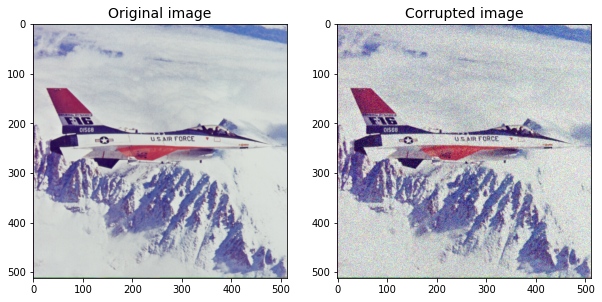

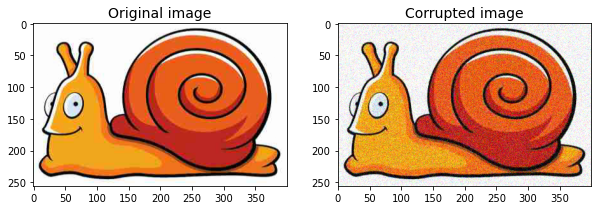

In [ ]:
images = load_denosing_images(PATH_TO_DENOSING)
noised_images = [noise_image(image, std=0.1) for image in images]
labels = ['plane', 'snail']
data = {label: (img, noised_img) for label, img, noised_img in zip(labels, images, noised_images)}

plot_images(data['plane'], ['Original image', 'Corrupted image'])
plot_images(data['snail'], ['Original image', 'Corrupted image'])

In [ ]:
torch.manual_seed(RANDOM_STATE)

label = 'snail'
noise_channels = 32
uniform_borders = (0, 1)
unet_start_filters = 32
lr = 0.0005
denoising_dir = os.path.join(PATH_TO_MODELS, 'denoising')
os.makedirs(denoising_dir, exist_ok=True)

device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print('Device:', device)

denoising_unet = UnetModel(unet_start_filters, input_c=noise_channels, 
                           output_c=3, dropout=False, batch_norm=False)
optimizer = Adam(denoising_unet.parameters(), lr=lr)

model_name = f'{label}_{noise_channels}_{unet_start_filters}_{lr}_{uniform_borders[0]}_{uniform_borders[1]}.pth'
denoising_model_dir = os.path.join(denoising_dir, model_name)
print('Save model:', denoising_model_dir)

epochs = 6000
original_image, noised_image, noised_tensor, noise_input_z = get_denoise_input(data[label], n_channels=noise_channels, 
                                                                               params=uniform_borders)

print('Noise input shape:', noise_input_z.shape)
print('Number of trainable parameters:', sum(p.numel() for p in denoising_unet.parameters() if p.requires_grad))

Device: cuda:0
Save model: /content/drive/My Drive/Belov_Aleksandr_DL_HW3/models/denoising/snail_32_32_0.0005_0_1.pth
Noise input shape: torch.Size([1, 32, 256, 400])
Number of trainable parameters: 7774403


In [ ]:
if DO_TRAIN:
    losses, best_epoch = denoise_image(epochs, denoising_unet, optimizer, noised_tensor, noise_input_z,
                                       device=device, save_model=denoising_model_dir)

Input noise channels: 1
U-net start filters: 16
Learning rate: 0.001
Uniform borders: (0.0, 1.0)



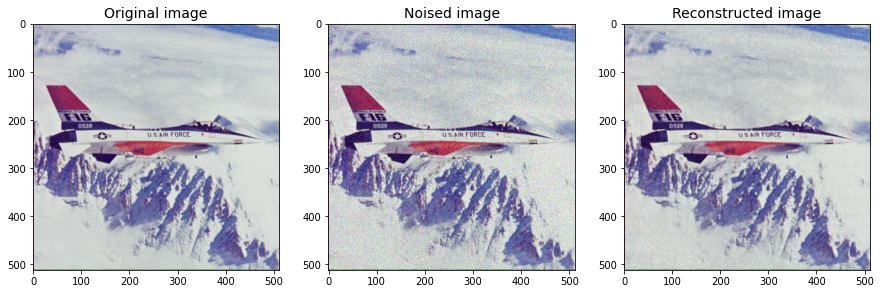

PSNR original & reconstructed: 30.1878
PSNR noised & reconstructed: 19.8080


Input noise channels: 1
U-net start filters: 32
Learning rate: 0.0005
Uniform borders: (0.0, 1.0)



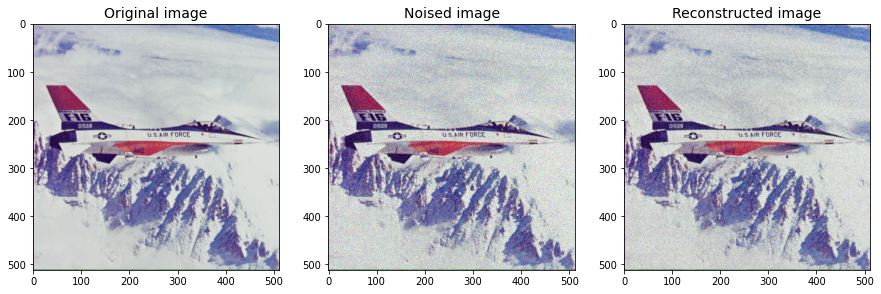

PSNR original & reconstructed: 26.1007
PSNR noised & reconstructed: 19.2282


Input noise channels: 32
U-net start filters: 16
Learning rate: 0.001
Uniform borders: (0.0, 1.0)



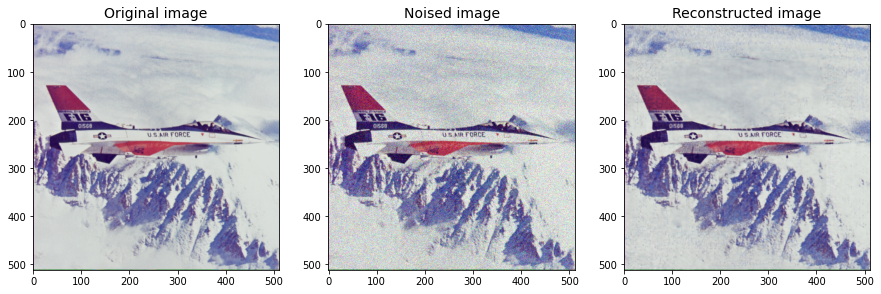

PSNR original & reconstructed: 30.5282
PSNR noised & reconstructed: 19.8368


Input noise channels: 3
U-net start filters: 16
Learning rate: 0.001
Uniform borders: (0.0, 1.0)



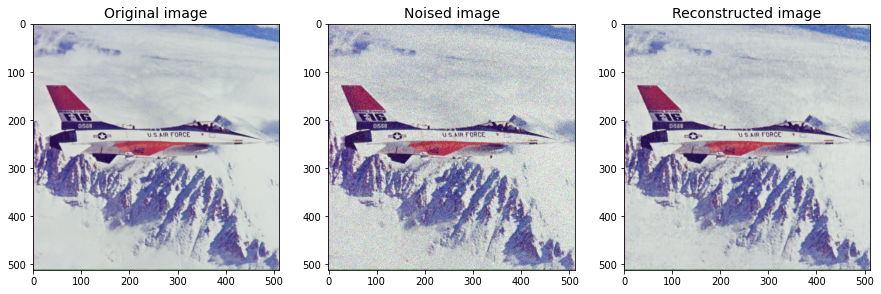

PSNR original & reconstructed: 30.6318
PSNR noised & reconstructed: 19.8467


Input noise channels: 1
U-net start filters: 16
Learning rate: 0.001
Uniform borders: (0.0, 1.0)



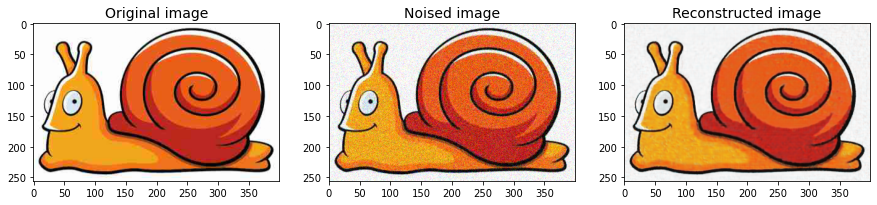

PSNR original & reconstructed: 27.6931
PSNR noised & reconstructed: 21.2061


Input noise channels: 1
U-net start filters: 32
Learning rate: 0.001
Uniform borders: (0.0, 1.0)



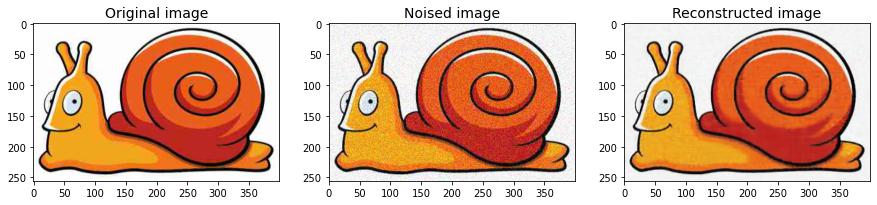

PSNR original & reconstructed: 27.3449
PSNR noised & reconstructed: 21.1263


Input noise channels: 32
U-net start filters: 16
Learning rate: 0.001
Uniform borders: (0.0, 1.0)



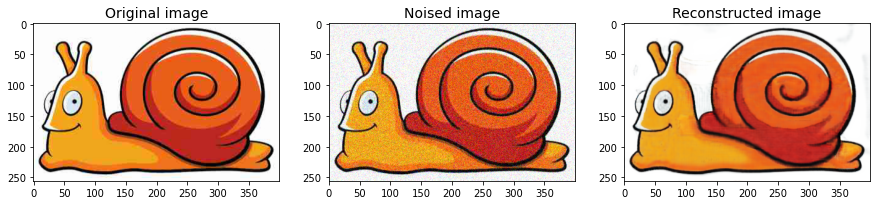

PSNR original & reconstructed: 27.0668
PSNR noised & reconstructed: 20.6569


Input noise channels: 32
U-net start filters: 32
Learning rate: 0.0005
Uniform borders: (0.0, 1.0)



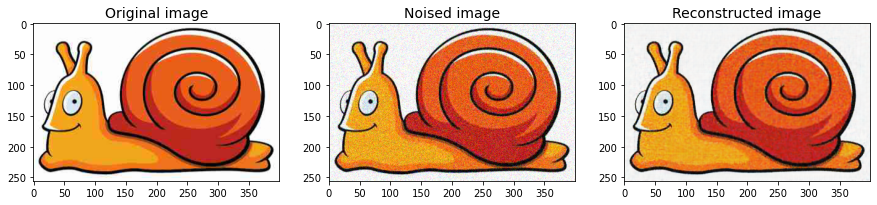

PSNR original & reconstructed: 27.6595
PSNR noised & reconstructed: 21.1546


Input noise channels: 3
U-net start filters: 16
Learning rate: 0.001
Uniform borders: (0.0, 1.0)



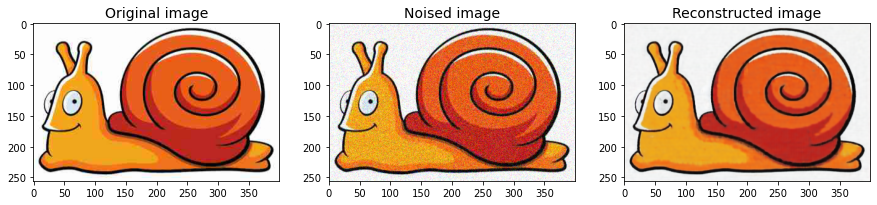

PSNR original & reconstructed: 27.3968
PSNR noised & reconstructed: 21.1778


Input noise channels: 3
U-net start filters: 32
Learning rate: 0.001
Uniform borders: (0.0, 1.0)



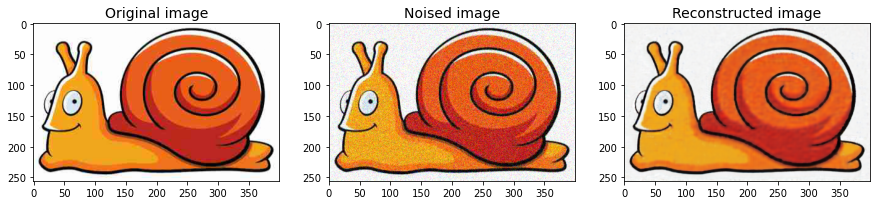

PSNR original & reconstructed: 27.1072
PSNR noised & reconstructed: 21.0909




In [ ]:
denoising_models = [f for f in sorted(os.listdir(denoising_dir)) if f.endswith('.pth')]

for model_name in denoising_models:
    original_image, noised_image, reconstructed_image_np = reconstruct_image(denoising_dir, 
                                                                             model_name, 
                                                                             get_denoise_input
                                                                            )
    plot_images([original_image, noised_image, reconstructed_image_np],
                ['Original image', 'Noised image', 'Reconstructed image'],
                figsize=(15, 7)
               )

    print(f'PSNR original & reconstructed: {peak_signal_noise_ratio(original_image, reconstructed_image_np):.4f}')
    print(f'PSNR noised & reconstructed: {peak_signal_noise_ratio(noised_image, reconstructed_image_np):.4f}')
    print(end='\n\n')

## Inpainting

In [ ]:
def mask_image(image, mask):
    masked_image = image * mask[:, :, np.newaxis]
    return masked_image


def get_inpainting_input(images, n_channels=3, params=None):
    original_image, masked_image, mask = images
    masked_tensor = ToTensor()(masked_image).type(torch.float32)
    masked_tensor = masked_tensor.unsqueeze(0)
    mask_tensor = ToTensor()(mask).type(torch.float32)
    mask_tensor = mask_tensor.unsqueeze(0)

    h, w = original_image.shape[:2]
    noise_input = uniform(1, n_channels, h, w, params=params)

    return original_image, masked_image, masked_tensor, mask_tensor, noise_input

In [ ]:
def inpaint_image(epochs, net, optimizer, masked_tensor, mask_tensor, noise_input_z,
                  device=torch.device('cpu'), perturbation=0.001, freq=500, save_model=None):

    losses = []

    net.to(device)
    masked_image = tensor_to_np_image(masked_tensor)
    noise_input_z = noise_input_z.to(device)
    masked_tensor = masked_tensor.to(device)
    mask_tensor = mask_tensor.to(device)

    best_loss = 1e24
    best_epoch = -1

    for epoch in range(1, epochs + 1):

        noise_input = noise_input_z + normal(noise_input_z.shape, std=perturbation).to(device)

        reconstructed_image = net(noise_input)
        reconstructed_image = torch.sigmoid(reconstructed_image)

        loss = torch.nn.functional.mse_loss(reconstructed_image * mask_tensor, 
                                            masked_tensor
                                           )

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        loss = loss.item()
        losses.append(loss)

        if best_loss > loss:
            best_epoch = epoch
            best_loss = loss
            torch.save(net.state_dict(), save_model)

        if epoch % freq == 0:
            print(f'{epoch}/{epochs} | Loss: {loss:.4f} |',
                  f'The best loss: {best_loss:.4f} | The best epoch: {best_epoch}')

            reconstructed_image_np = tensor_to_np_image(reconstructed_image)
            plot_images([masked_image, reconstructed_image_np],
                        ['Masked image', 'Reconstructed image']
                       )

    return losses, best_epoch

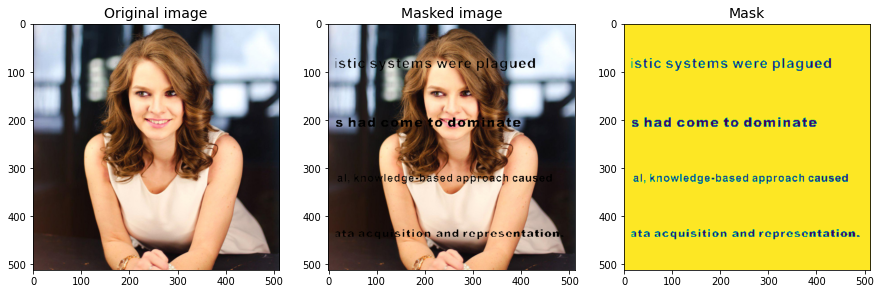

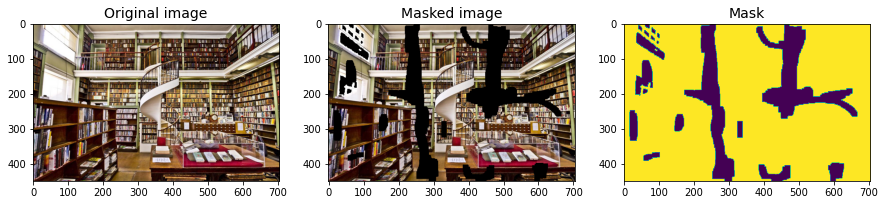

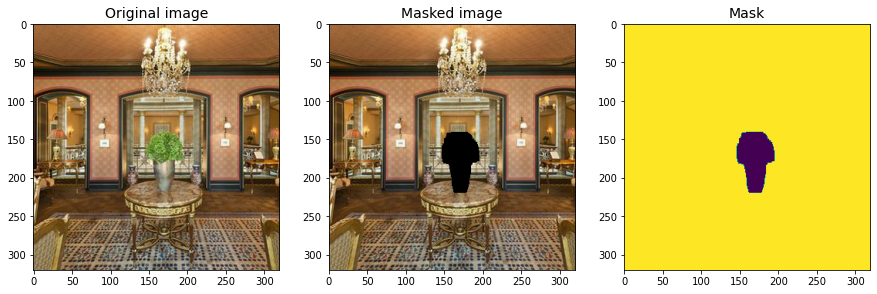

In [ ]:
images, masks = load_inpainting_images(PATH_TO_INPAINTING)
labels = ['kate', 'library', 'vase']
masked_images = [mask_image(image, mask) for image, mask in zip(images, masks)]
data = {label: (img, masked_img, mask) for label, img, masked_img, mask in zip(labels, images, masked_images, masks)}

for label in labels:
    plot_images(data[label], ['Original image', 'Masked image', 'Mask'], figsize=(15, 7))

In [ ]:
torch.manual_seed(RANDOM_STATE)

label = 'library'
noise_channels = 3
uniform_borders = (0, 1)
unet_start_filters = 16
lr = 0.0002
inpainting_dir = os.path.join(PATH_TO_MODELS, 'inpainting')
os.makedirs(inpainting_dir, exist_ok=True)

device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print('Device:', device)

inpainting_unet = UnetModel(unet_start_filters, input_c=noise_channels, 
                           output_c=3, dropout=False, batch_norm=False)
optimizer = Adam(inpainting_unet.parameters(), lr=lr)

model_name = f'{label}_{noise_channels}_{unet_start_filters}_{lr}_{uniform_borders[0]}_{uniform_borders[1]}.pth'
inpainting_model_dir = os.path.join(inpainting_dir, model_name)
print('Save model:', inpainting_model_dir)

epochs = 20000
original_image, masked_image, masked_tensor, mask_tensor, noise_input_z = get_inpainting_input(
                                                                                  data[label], 
                                                                                  n_channels=noise_channels, 
                                                                                  params=uniform_borders
                                                                                  )

print('Noise input shape:', noise_input_z.shape)
print('Number of trainable parameters:', sum(p.numel() for p in inpainting_unet.parameters() if p.requires_grad))

Device: cuda:0
Save model: /content/drive/My Drive/Belov_Aleksandr_DL_HW3/models/inpainting/library_3_16_0.0002_0_1.pth
Noise input shape: torch.Size([1, 3, 448, 704])
Number of trainable parameters: 1944083


In [ ]:
if DO_TRAIN:
    losses, best_epoch = inpaint_image(epochs, inpainting_unet, optimizer, masked_tensor, mask_tensor, 
                                       noise_input_z, device=device, save_model=inpainting_model_dir, freq=500
                                       )

Input noise channels: 32
U-net start filters: 16
Learning rate: 5e-05
Uniform borders: (0.0, 1.0)



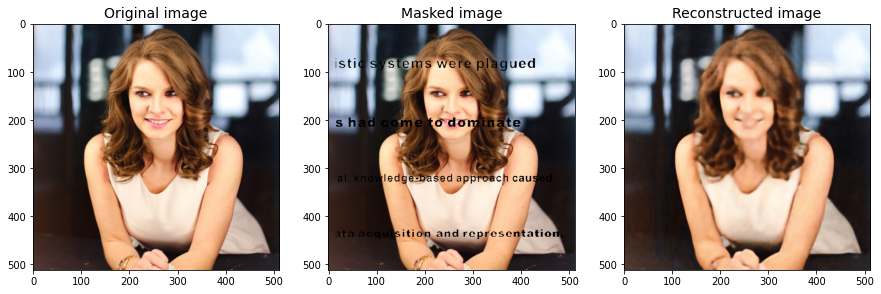

MSE original & reconstructed: 0.0010


Input noise channels: 3
U-net start filters: 16
Learning rate: 0.0002
Uniform borders: (0.0, 1.0)



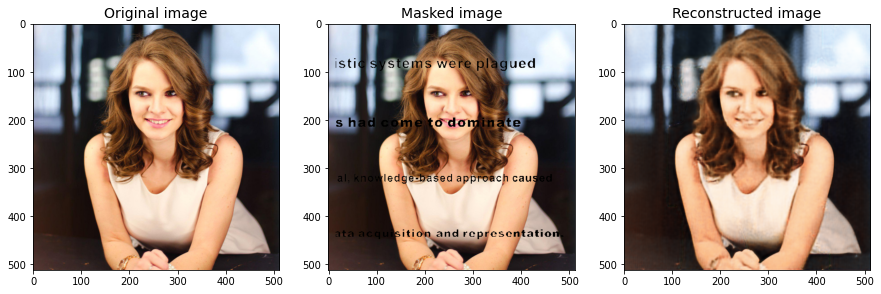

MSE original & reconstructed: 0.0006


Input noise channels: 32
U-net start filters: 16
Learning rate: 5e-05
Uniform borders: (0.0, 1.0)



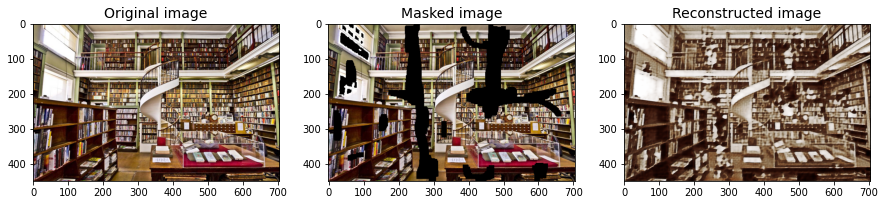

MSE original & reconstructed: 0.0262


Input noise channels: 3
U-net start filters: 16
Learning rate: 0.0002
Uniform borders: (0.0, 1.0)



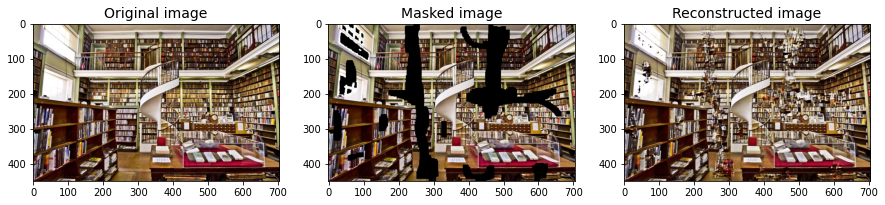

MSE original & reconstructed: 0.0189


Input noise channels: 32
U-net start filters: 16
Learning rate: 0.0001
Uniform borders: (0.0, 1.0)



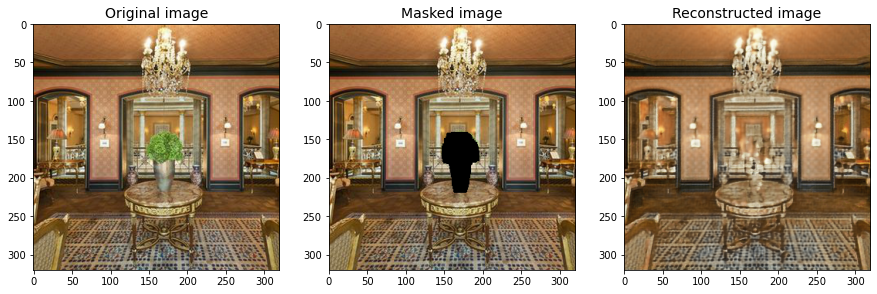

MSE original & reconstructed: 0.0035


Input noise channels: 3
U-net start filters: 16
Learning rate: 0.0002
Uniform borders: (0.0, 1.0)



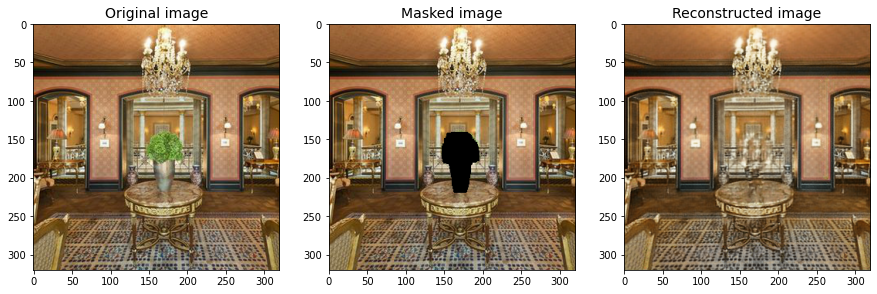

MSE original & reconstructed: 0.0024




In [ ]:
inpainting_models = [f for f in sorted(os.listdir(inpainting_dir)) if f.endswith('.pth')]

for model_name in inpainting_models:
    original_image, noised_image, reconstructed_image_np = reconstruct_image(inpainting_dir, 
                                                                             model_name, 
                                                                             get_inpainting_input
                                                                            )
    plot_images([original_image, noised_image, reconstructed_image_np],
                ['Original image', 'Masked image', 'Reconstructed image'],
                figsize=(15, 7)
                )

    print(f'MSE original & reconstructed: {np.mean((original_image-reconstructed_image_np)**2):.4f}')
    print(end='\n\n')

## Conclusions Part 2

U-net model from Part 2 with different number of start filters (16, 32) and different number of channels in noise input tensor (1, 3, 32) were tested for both tasks.

The noise input tensor was sampled from $U(0, 1)$.

### Denoising
**The best PSNR score between original and reconstructed was shown by the following parameters:**  
- Snail: *channels of noise input - 1, start channels of U-net - 16, PSNR - 27.6931;*
- But visually better with: *channels of noise input - 3, start channels of U-net - 16;*

- Plane: *channels of noise input - 3, start channels of U-net - 16, PSNR - 30.6318;*

### Inpainting
- The best MSE score between original and reconstructed was shown by the following parameters: *channels of noise input - 3, start channels of U-net - 16.*

# Part 3. Variational Autoencoder (VAE) — 15 points

Useful links: 
* Original paper http://arxiv.org/abs/1312.6114
* Helpful videos explaining the topic 
   * https://www.youtube.com/watch?v=P78QYjWh5sM     
   * http://videolectures.net/deeplearning2015_courville_autoencoder_extension/?q=aaron%20courville

In this homework we will train an autoencoder to model images of faces. For this we take "Labeled Faces in the Wild" dataset (LFW) (http://vis-www.cs.umass.edu/lfw/), deep funneled version of it. (frontal view of all faces)


### Prepare the data

In [ ]:
from time import time
import numpy as np

import torch
from torch import nn
import torch.nn.functional as F
import torch.optim as optim
import torch.utils.data as data_utils

from IPython.display import clear_output
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
!wget https://raw.githubusercontent.com/yandexdataschool/Practical_DL/hw3_19/homework03/lfw_dataset.py -O lfw_dataset.py

--2020-05-12 16:06:55--  https://raw.githubusercontent.com/yandexdataschool/Practical_DL/hw3_19/homework03/lfw_dataset.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 151.101.0.133, 151.101.64.133, 151.101.128.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|151.101.0.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2734 (2.7K) [text/plain]
Saving to: ‘lfw_dataset.py’

lfw_dataset.py      100%[===================>]   2.67K  --.-KB/s    in 0s      

2020-05-12 16:06:55 (29.8 MB/s) - ‘lfw_dataset.py’ saved [2734/2734]



In [ ]:
#@title Utility functions
import numpy as np
import os
import skimage.io
import skimage
import skimage.transform
import pandas as pd

def fetch_lfw_dataset(attrs_name = "lfw_attributes.txt",
                      images_name = "lfw-deepfunneled",
                      raw_images_name = "lfw",
                      use_raw=False,
                      dx=80,dy=80,
                      dimx=45,dimy=45
    ): # sad smile

    #download if not exists
    if (not use_raw) and not os.path.exists(images_name):
        print("images not found, donwloading...")
        os.system("wget http://vis-www.cs.umass.edu/lfw/lfw-deepfunneled.tgz -O tmp.tgz")
        print("extracting...")
        os.system("tar xvzf tmp.tgz && rm tmp.tgz")
        print("done")
        assert os.path.exists(images_name)
    
    if use_raw and not os.path.exists(raw_images_name):
        print("images not found, donwloading...")
        os.system("wget http://vis-www.cs.umass.edu/lfw/lfw.tgz -O tmp.tgz")
        print("extracting...")
        os.system("tar xvzf tmp.tgz && rm tmp.tgz")
        print("done")
        assert os.path.exists(raw_images_name)

    if not os.path.exists(attrs_name):
        print("attributes not found, downloading...")
        os.system("wget http://www.cs.columbia.edu/CAVE/databases/pubfig/download/%s" % attrs_name)
        print("done")

    #read attrs
    df_attrs = pd.read_csv("lfw_attributes.txt",sep='\t',skiprows=1,) 
    df_attrs = pd.DataFrame(df_attrs.iloc[:,:-1].values, columns = df_attrs.columns[1:])


    #read photos
    dirname = raw_images_name if use_raw else images_name
    photo_ids = []
    for dirpath, dirnames, filenames in os.walk(dirname):
        for fname in filenames:
            if fname.endswith(".jpg"):
                fpath = os.path.join(dirpath,fname)
                photo_id = fname[:-4].replace('_',' ').split()
                person_id = ' '.join(photo_id[:-1])
                photo_number = int(photo_id[-1])
                photo_ids.append({'person':person_id,'imagenum':photo_number,'photo_path':fpath})

    photo_ids = pd.DataFrame(photo_ids)

    #mass-merge
    #(photos now have same order as attributes)
    df_attrs['imagenum'] = df_attrs['imagenum'].astype(np.int64)
    df = pd.merge(df_attrs, photo_ids, on=('person','imagenum'))

    assert len(df)==len(df_attrs),"lost some data when merging dataframes"

    #image preprocessing
    all_photos = df['photo_path'].apply(lambda img: skimage.io.imread(img))\
                                 .apply(lambda img:img[dy:-dy,dx:-dx])\
                                 .apply(lambda img: skimage.img_as_ubyte(skimage.transform.resize(img,[dimx,dimy])))

    all_photos = np.stack(all_photos.values).astype('uint8')
    all_attrs = df.drop(["photo_path","person","imagenum"],axis=1)
    
    return all_photos,all_attrs

In [ ]:
def train_step_ae(net, train_loader, criterion, optimizer):
    train_losses = []
    net.train()

    for X, _ in train_loader:
        X = X.to(device)

        pred, latent_code = net(X)
        loss = criterion(pred, X)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        train_losses.append(loss.item())

    loss = sum(train_losses) / len(train_losses)
    return loss


def eval_ae(net, val_loader, criterion, plot):
    val_losses = []
    net.eval()

    for i, (X, _) in enumerate(val_loader):
        X = X.to(device)

        pred, latent_code = net(X)
        loss = criterion(pred, X)
        val_losses.append(loss.item())

        if i == 2754:
            putin = pred.cpu().detach().numpy()

    if plot:
        plot_images(X[0], pred[0])

    loss = sum(val_losses) / len(val_losses)
    return loss, putin


def train_ae(epochs, net, criterion, optimizer, train_loader, val_loader,
             scheduler=None, verbose=True, save_dir=None, log_file=None, 
             label='model', freq=10, plot=False):

    net.to(device)
    best_loss = 1e24
    losses = {'train': [], 'val': []}
    putins = []

    for epoch in range(1, epochs+1):
        clear_output(wait=True)
        t = time()
        train_loss = train_step_ae(net, train_loader, criterion, optimizer)
        val_loss, putin = eval_ae(net, val_loader, criterion, plot)

        losses['train'].append(train_loss)
        losses['val'].append(val_loss)
        putins.append(putin)

        if scheduler is not None:
            scheduler.step()

        lr = optimizer.param_groups[0]['lr']
        log_line =  f'{epoch}/{epochs} || LR: {lr:.5f} | ' + \
                    f'Train:  Loss {train_loss:.4f} || ' + \
                    f'Val: Loss {val_loss:.4f} || {time()-t:.1f} sec'

        if verbose:
            print(log_line)

        if log_file:
            with open(log_file, 'a') as f:
                f.write(log_line + '\n')

        if plot:
            plot_losses(losses)

    return losses, putins

In [ ]:
def plot_images(X, pred, figsize=(10, 5)):
    fig, axis = plt.subplots(1, 2, figsize=figsize)

    axis[0].imshow(X.cpu().detach().numpy().reshape(image_h, image_w, 3))
    axis[0].set_title('Source image', fontsize=16)
    axis[0].axis('off')

    pred = pred.cpu().detach().numpy().reshape(image_h, image_w, 3)
    pred = np.clip(pred, 0, 1)
    axis[1].imshow(pred)
    axis[1].set_title('AE output', fontsize=16)
    axis[1].axis('off')

    plt.show()


def plot_losses(losses, figsize=(15, 6)):
    plt.figure(figsize=figsize)

    plt.plot(losses['train'], label='Train loss')
    plt.plot(losses['val'], label='Val loss')
    plt.xlabel('n_epoch', fontsize=14)
    plt.title('Train & Val losses', fontsize=16)
    plt.legend(loc='best', fontsize=14)


    y_min = min(losses['train'] + losses['val'])
    y_max = max(losses['train'])
    y_diff = (y_max - y_min)/10
    plt.ylim([y_min - y_diff, y_max + y_diff])

    plt.grid()
    plt.show()

In [ ]:
RANDOM_STATE = 42

In [ ]:
data, attrs = fetch_lfw_dataset(dimx=36, dimy=36)
data = data / 255

np.savez(os.path.join(AUX_DATA_ROOT, "real.npz"), Pictures=data.reshape(data.shape[0], 36*36*3))
data_size = len(data)
data_size

images not found, donwloading...
extracting...
done
attributes not found, downloading...
done


13143

In [ ]:
X_train = data[:10000].reshape((10000, -1))
print(X_train.shape)
X_val = data[10000:].reshape((-1, X_train.shape[1]))
print(X_val.shape)

image_h = data.shape[1]
image_w = data.shape[2]

(10000, 3888)
(3143, 3888)


For simplicity we want all values of the data to lie in the interval $[0,1]$:

In [ ]:
X_train = np.float32(X_train)
X_val = np.float32(X_val)

In [ ]:
def plot_gallery(images, h, w, n_row=3, n_col=6):
    """Helper function to plot a gallery of portraits"""
    plt.figure(figsize=(1.5 * n_col, 1.7 * n_row))
    plt.subplots_adjust(bottom=0, left=.01, right=.99, top=.90, hspace=.35)
    for i in range(n_row * n_col):
        plt.subplot(n_row, n_col, i + 1)
        plt.imshow(images[i].reshape((h, w, 3)), cmap=plt.cm.gray, vmin=-1, vmax=1, interpolation='nearest')
        plt.xticks(())
        plt.yticks(())

    plt.show()

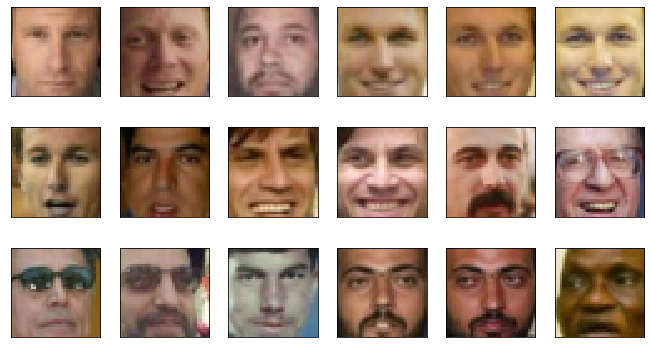

In [ ]:
plot_gallery(X_train, image_h, image_w)

In [ ]:
train = data_utils.TensorDataset(torch.Tensor(X_train), torch.zeros(X_train.shape[0],)) # pseudo labels needed to define TensorDataset
train_loader = data_utils.DataLoader(train, batch_size=100, shuffle=True)

val = data_utils.TensorDataset(torch.Tensor(X_val), torch.zeros(X_val.shape[0],))
val_loader = data_utils.DataLoader(val, batch_size=1, shuffle=False)

## Autoencoder

Why to use all this complicated formulas and regularizations, what is the need for variational inference? To analyze the difference, let's first train just an autoencoder on the data:

<img src="https://lilianweng.github.io/lil-log/assets/images/autoencoder-architecture.png" alt="Autoencoder">

In [ ]:
dimZ = 100 # Considering face reconstruction task, which size of representation seems reasonable?

# Define the decoder and encoder as networks with one hidden fc-layer
# (that means you will have 2 fc layers in each net)
# Use ReLU for hidden layers' activations
# GlorotUniform initialization for W
# Zero initialization for biases
# It's also convenient to put sigmoid activation on output layer to get nice normalized pics

class Autoencoder(nn.Module):
    def __init__(self, layer_n_input, layer_n_output):
        super(Autoencoder, self).__init__()

        #TODO

        self.encoder = nn.Sequential(nn.Linear(layer_n_input, layer_n_output),
                                     nn.ReLU(),
                                     nn.BatchNorm1d(layer_n_output),
                                     nn.Linear(layer_n_output, dimZ),
                                     nn.BatchNorm1d(dimZ),
                                    )
        self.decoder = nn.Sequential(nn.Linear(dimZ, layer_n_output),
                                     nn.ReLU(),
                                     nn.BatchNorm1d(layer_n_output),
                                     nn.Linear(layer_n_output, layer_n_input),
                                     nn.Sigmoid()
                                    )

        self.apply(self._weight_init)

    def _weight_init(self, layer):
        if isinstance(layer, nn.Linear):
            f_out, f_in = layer.weight.shape
            a = 0.1 * np.sqrt(6 / (f_in + f_out))

            layer.weight.data.uniform_(-a, a)
            layer.bias.data.zero_()

    def forward(self, x):
        #TODO

        latent_code = self.encoder(x)
        reconstruction = self.decoder(latent_code)

        return reconstruction, latent_code

In [ ]:
torch.manual_seed(RANDOM_STATE)
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print('Device:', device)

# Create MSE loss function
criterion = torch.nn.MSELoss()

input_shape = image_h * image_w * 3
autoencoder = Autoencoder(input_shape, 1024).to(device)

# Use Adam optimizer
optimizer = optim.Adam(autoencoder.parameters(), lr=0.0001)

epochs = 100

Device: cuda:0


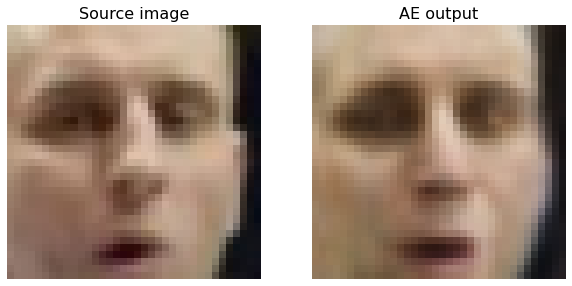

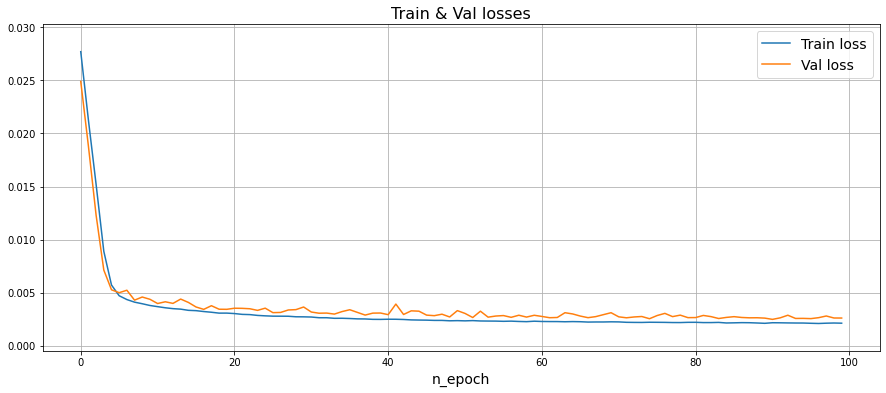

In [ ]:
# Train your autoencoder
# Visualize progress in reconstruction and loss decay

losses, image_progress = train_ae(epochs, autoencoder, criterion, optimizer,
                                  train_loader, val_loader, plot=True, verbose=False)

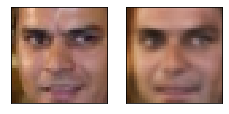

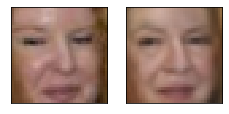

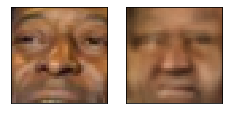

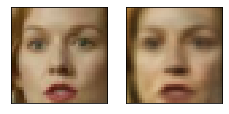

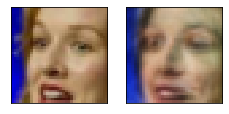

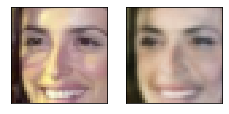

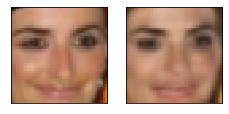

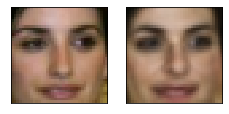

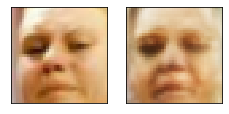

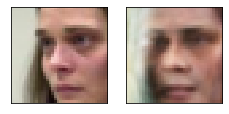

In [ ]:
# Examine the reconstructions
for j, data in enumerate(val_loader, 1):
    inp = data[0].cuda()
    pred, _ = autoencoder(inp)
    plot_gallery([data[0].numpy(), pred.data.cpu().numpy()], image_h, image_w, n_row=1, n_col=2)
    if (j >= 10):
        break

Reconstruction is not bad, right? 

## Sampling

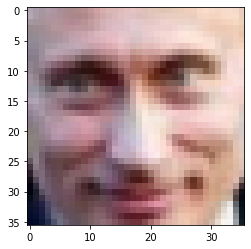

In [ ]:
for i, (putin, y) in enumerate(val_loader):
    if i == 2754:
        break
plt.imshow(putin.numpy().reshape((image_w, image_w, 3)))

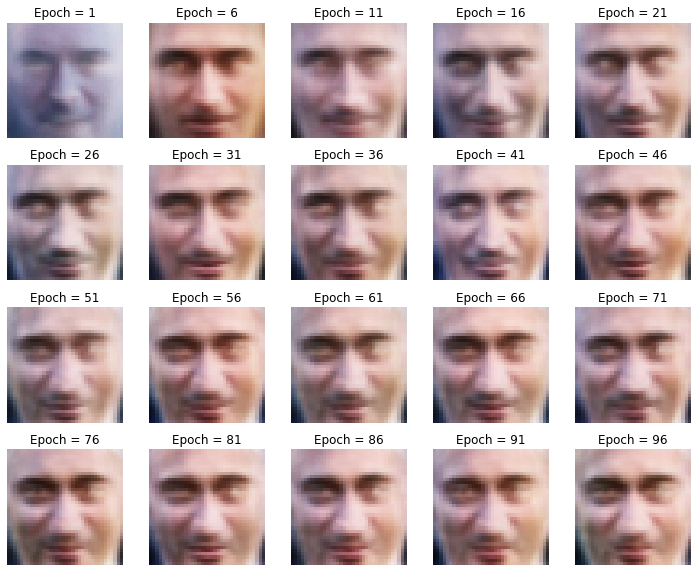

In [ ]:
plt.figure(figsize=(10, 12))
#plt.suptitle('Twin farm')
for i in range(20):
    plt.subplots_adjust(bottom=0.0, left=.1, right=.9, top=.50, hspace=.15)
    plt.subplot(6, 5, 5*(i//5) + i % 5 + 1)
    plt.imshow(image_progress[i*5+1].reshape(image_w, image_h, 3))
    plt.title('Epoch = {}'.format(i * 5 + 1))
    plt.axis('off')
plt.tight_layout()

Let's now sample several latent vectors and perform inference from $z$, reconstruct an image given some random $z$ representations.

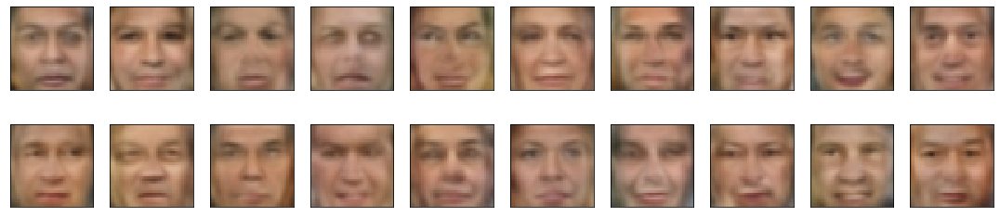

In [ ]:
z = (np.random.randn(20, dimZ)*0.5).astype('float32')
output = autoencoder.decoder(torch.from_numpy(z).cuda()).clamp(0, 1)
plot_gallery(output.data.cpu().numpy(), image_h, image_w, n_row=2, n_col=10)

So, if we sample $z$ from normal, whould we eventually generate all possible faces? What do you think?

## Variational Autoencoder

Bayesian approach in deep learning considers everything in terms of distributions. Now our encoder generates not just a vector $z$ but posterior ditribution $q(z|x)$. In our case distribution $q$ is Gaussian distibution $N(\mu, \sigma)$ with parameters $\mu$, $\sigma$. Technically, the first difference is that you need to split bottleneck layer in two. One dense layer will generate vector $\mu$, and another will generate vector $\sigma$. Reparametrization trick should be implemented using the **gaussian_sampler** layer, that generates random vetor $\epsilon$ and returns $\mu+\sigma\epsilon \sim N(\mu, \sigma)$ .

Since our decoder is also a function that generates distribution, we need to do the same splitting for output layer. When testing the model we will look only on mean values, so one of the output will be actual autoencoder output.

In this homework we only ask for implementation of the simplest version of VAE - one $z$ sample per input. You can consider to sample several outputs from one input and average them.

In [ ]:
def train_step_vae(net, train_loader, criterion, optimizer):
    train_losses = []
    net.train()

    for X, _ in train_loader:
        X = X.to(device)

        output = net(X)
        loss = criterion(X, output)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        train_losses.append(loss.item())

    loss = sum(train_losses) / len(train_losses)
    return loss


def eval_vae(net, val_loader, criterion, plot):
    val_losses = []
    net.eval()

    for X, _ in val_loader:
        X = X.to(device)

        output = net(X)
        loss = criterion(X, output)
        val_losses.append(loss.item())

    if plot:
        plot_images(X[0], output[0])

    loss = sum(val_losses) / len(val_losses)
    return loss


def train_vae(epochs, net, criterion, optimizer, train_loader, val_loader,
              scheduler=None, verbose=True, save_dir=None, log_file=None, 
              label='model', freq=10, plot=False):

    net.to(device)
    losses = {'train': [], 'val': []}

    for epoch in range(1, epochs+1):
        clear_output(wait=True)
        t = time()
        train_loss = train_step_vae(net, train_loader, criterion, optimizer)
        val_loss = eval_vae(net, val_loader, criterion, plot)

        losses['train'].append(train_loss)
        losses['val'].append(val_loss)

        if scheduler is not None:
            scheduler.step()

        lr = optimizer.param_groups[0]['lr']
        log_line =  f'{epoch}/{epochs} || LR: {lr:.5f} | ' + \
                    f'Train:  Loss {train_loss:.4f} || ' + \
                    f'Val: Loss {val_loss:.4f} || {time()-t:.1f} sec'

        if verbose:
            print(log_line)

        if log_file:
            with open(log_file, 'a') as f:
                f.write(log_line + '\n')

        if plot:
            plot_losses(losses)

    return losses

In [ ]:
# to compare with conventional AE, keep these hyperparameters
# or change them for the values that you used before
dimZ = 100

# define the network
# you can start from https://github.com/pytorch/examples/blob/master/vae/main.py
# or Theano-based examples here 
# https://github.com/Lasagne/Recipes/blob/master/examples/variational_autoencoder/variational_autoencoder.py
# and here https://github.com/y0ast/Variational-Autoencoder/blob/master/VAE.py
# but remember that this is not your ground truth since the data is not MNIST

class VAE(nn.Module):
    def __init__(self, layer_n_input, layer_n_output):
        super(VAE, self).__init__()

        #TODO
        self.encoder = nn.Sequential(nn.Linear(layer_n_input, layer_n_output),
                                     nn.ReLU(),
                                     nn.BatchNorm1d(layer_n_output),
                                    )

        self.mu_encoder = nn.Sequential(nn.Linear(layer_n_output, dimZ),
                                        nn.BatchNorm1d(dimZ),
                                       ) 
        self.logsigma_encoder = nn.Sequential(nn.Linear(layer_n_output, dimZ),
                                              nn.BatchNorm1d(dimZ),
                                             ) 

        self.decoder = nn.Sequential(nn.Linear(dimZ, layer_n_output),
                                     nn.ReLU(),
                                     nn.BatchNorm1d(layer_n_output)
                                    )

        self.mu_decoder = nn.Linear(layer_n_output, layer_n_input)
        self.logsigma_decoder = nn.Linear(layer_n_output, layer_n_input)

        self.apply(self._weight_init)

    def _weight_init(self, layer):
        if isinstance(layer, nn.Linear):
            f_out, f_in = layer.weight.shape
            a = 0.1 * np.sqrt(6 / (f_in + f_out))

            layer.weight.data.uniform_(-a, a)
            layer.bias.data.zero_()

    def gaussian_sampler(self, mu, logsigma):
        if self.training:
            std = logsigma.exp()
            eps = std.data.new(std.size()).normal_()
            return eps.mul(std).add(mu)
        else:
            return mu

    def forward(self, x):
        # TODO
        latent_code = self.encoder(x)
        latent_mu = self.mu_encoder(latent_code)
        latent_logsigma = self.logsigma_encoder(latent_code)

        z = self.gaussian_sampler(latent_mu, latent_logsigma)

        decoded_z = self.decoder(z)
        reconstruction_mu = torch.sigmoid(self.mu_decoder(decoded_z))
        reconstruction_logsigma = self.logsigma_decoder(decoded_z)

        return reconstruction_mu, reconstruction_logsigma, latent_mu, latent_logsigma

And the last, but not least! Place in the code where the most of the formulaes goes to - optimization objective. The objective for VAE has it's own name - variational lowerbound. And as for any lowerbound our intention is to maximize it. Here it is (for one sample $z$ per input $x$):

$$\mathcal{L} = -D_{KL}(q_{\phi}(z|x)||p(z)) + \log p_{\theta}(x|z)$$

Your next task is to implement two functions that compute KL-divergence and the second term - log-likelihood of an output. Here is some necessary math for your convenience:

$$D_{KL} = -\frac{1}{2}\sum_{i=1}^{dimZ}(1+log(\sigma_i^2)-\mu_i^2-\sigma_i^2)$$
$$\log p_{\theta}(x|z) = \sum_{i=1}^{dimX}\log p_{\theta}(x_i|z)=\sum_{i=1}^{dimX} \log \Big( \frac{1}{\sigma_i\sqrt{2\pi}}e^{-\frac{(\mu_i-x)^2}{2\sigma_i^2}} \Big)=...$$

Don't forget in the code that you are using $\log\sigma$ as an input. Explain, why not $\sigma$?

In [ ]:
def KL_divergence(mu, logsigma):
    return -0.5 * torch.sum(1 + 2*logsigma - mu**2 - torch.exp(logsigma)**2, dim=1)


def log_likelihood(x, mu, logsigma):
    return torch.sum(-0.5 * torch.log(torch.tensor(2 * np.pi)) - logsigma 
                     - (mu - x)**2 /torch.exp(logsigma)**2 / 2, dim=1)


def loss_vae(x, params):
    mu_gen, logsigma_gen, mu_z, logsigma_z = params
    return torch.mean(KL_divergence(mu_z, logsigma_z) - log_likelihood(x, mu_gen, logsigma_gen))

And train the model:

In [ ]:
# train your autoencoder
# visualize progress in reconstruction and loss decay

torch.manual_seed(RANDOM_STATE)
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print('Device:', device)

criterion = loss_vae

input_shape = image_h * image_w * 3
vae = VAE(input_shape, 1024).to(device)

# Use Adam optimizer
optimizer = optim.Adam(vae.parameters(), lr=0.0001)

epochs = 100

Device: cuda:0


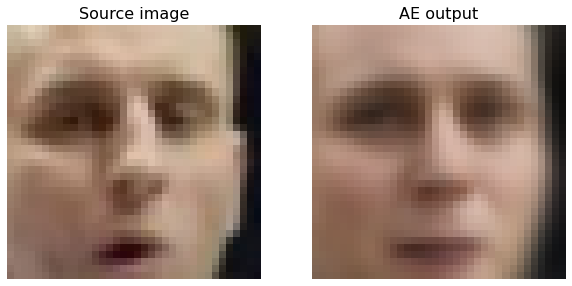

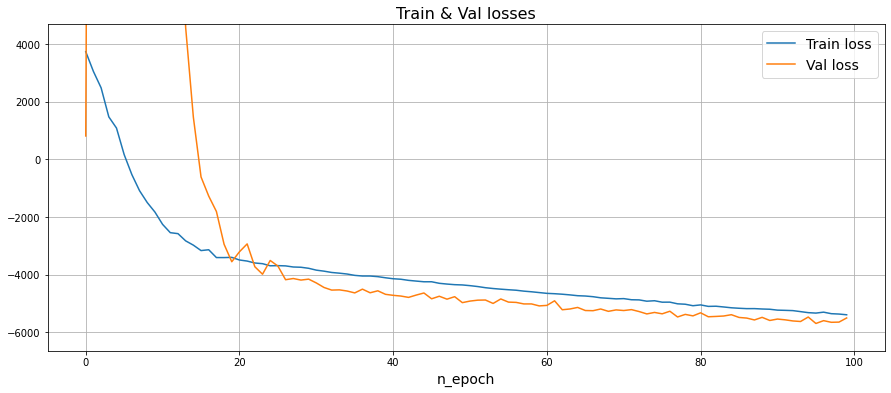

In [ ]:
# Train your autoencoder
# Visualize progress in reconstruction and loss decay

losses = train_vae(epochs, vae, criterion, optimizer,
                   train_loader, val_loader, plot=True, verbose=False)

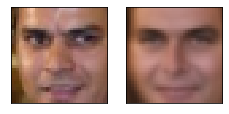

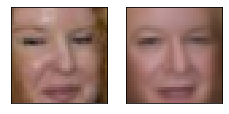

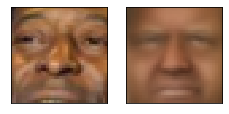

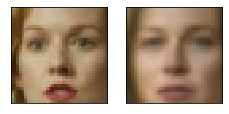

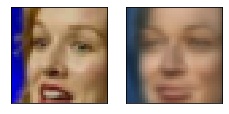

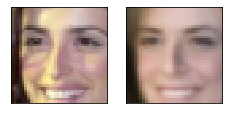

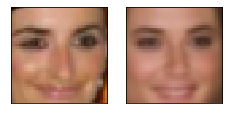

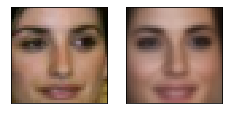

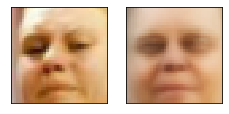

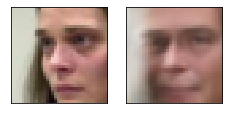

In [ ]:
#val_loader = data_utils.DataLoader(val, batch_size=1, shuffle=True)
vae.eval()
for j, data in enumerate(val_loader, 1):
    input = data[0].cuda()
    reconstruction_mu, _, _, _ = vae(input)
    plot_gallery([data[0].numpy(), reconstruction_mu.data.cpu().numpy()], image_h, image_w, n_row=1, n_col=2)
    if (j >= 10):
        break

And finally sample from VAE.

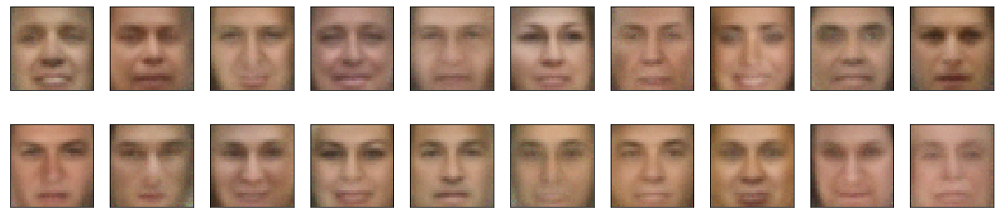

In [ ]:
# TODO
# Sample some images from the learned distribution
# 1) Sample z ~ N(0,1)
# 2) Sample from N(decoder_mu(z), decoder_sigma(z))

def generate_from_vae(vae, size, seed=None):
    if seed:
        torch.manual_seed(seed)

    z = torch.randn(size, dimZ).to(device)
    z_decoded = vae.decoder(z)
    mu = vae.mu_decoder(z_decoded).cpu().detach()
    logsigma = vae.logsigma_decoder(z_decoded).cpu().detach()

    output = torch.sigmoid(mu + torch.exp(logsigma)*torch.randn(mu.shape))

    return np.clip(output.numpy(), 0, 1)


output = generate_from_vae(vae, 20, seed=RANDOM_STATE)
plot_gallery(output, image_h, image_w, n_row=2, n_col=10)

Even if in practice you do not see the much difference between AE and VAE, or VAE is even worse, the little bayesian inside you should be jumping for joy right now. 

In VAE you can truly sample from image distribution $p(x)$, while in AE there is no easy and correct way to do it. 

### If you are going to do part 4 (presicion-recall score): 

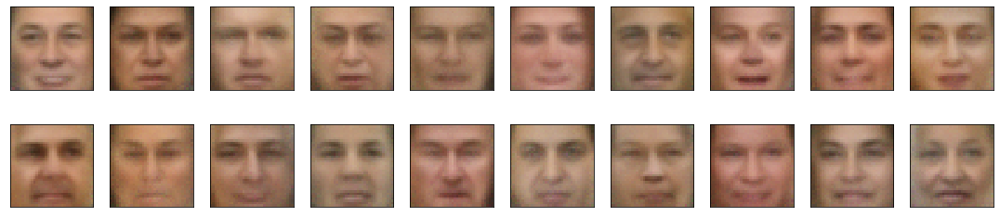

(13143, 3888)

In [ ]:
# using your model, generate face set with len = len(data)
answ = generate_from_vae(vae, data_size, seed=RANDOM_STATE)

plot_gallery(answ[-20:], image_h, image_w, n_row=2, n_col=10)
answ.shape

### Save it ot npz

In [ ]:
np.savez(os.path.join(AUX_DATA_ROOT, "vae.npz"), Pictures=answ)

## Congrats! and Bonus

If you managed to tune your autoencoders to converge and learn something about the world, now it's time to make fun out of it. As you may have noticed, there are face attributes in dataset. We're interesting in "Smiling" column, but feel free to try others as well! Here is the first task:

1) Extract the "Smilling" attribute and create a two sets of images: 10 smiling faces and 10 non-smiling ones.

2) Compute latent representations for each image in "smiling" set and average those latent vectors. Do the same for "non-smiling" set. You have found **"vector representation"** of the "smile" and "no smile" attribute.

3) Compute the difference: "smile" vector minus "non-smile" vector.

3) Now check if **"feature arithmetics"** works. Sample a face without smile, encode it and add the diff from p. 3. Check if it works with both AE and VAE. 

Smiling images:


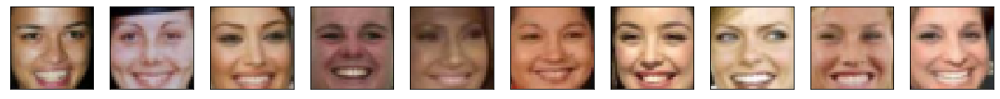

Neutral images:


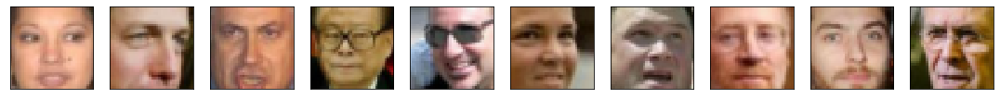

Non-smiling images:


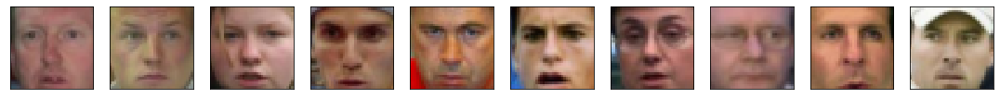

In [ ]:
# TODO
smiling_train = attrs['Smiling'].values[:len(X_train)]
smiling_idx = np.argsort(smiling_train)

smiling_images = X_train[smiling_idx[-10:]]
neutral_images = X_train[smiling_idx[5010:5020]]
nonsmiling_images = X_train[smiling_idx[:10]]

print('Smiling images:')
plot_gallery(smiling_images, image_h, image_w, n_row=1, n_col=10)
print('Neutral images:')
plot_gallery(neutral_images, image_h, image_w, n_row=1, n_col=10)
print('Non-smiling images:')
plot_gallery(nonsmiling_images, image_h, image_w, n_row=1, n_col=10)

In [ ]:
def encode(model, data):
    if isinstance(model, Autoencoder):
        latent_code = model.encoder(torch.from_numpy(data).to(device))
    elif isinstance(model, VAE):
        latent_code = model.encoder(torch.from_numpy(data).to(device))
        latent_code = model.mu_encoder(latent_code)
    else:
        raise ValueError()

    return latent_code


def decode(model, latent_code):
    if isinstance(model, Autoencoder):
        data = model.decoder(latent_code)
    elif isinstance(model, VAE):
        z_decoded = model.decoder(latent_code)
        data = model.mu_decoder(z_decoded)
        data = torch.sigmoid(data)
    else:
        raise ValueError()

    return data.cpu().detach().numpy()


def latent_interpolation(start_lc, end_lc, sample_lc, points=10):
    start_lc_mean = start_lc.mean(dim=0, keepdim=True)
    end_lc_mean = end_lc.mean(dim=0, keepdim=True)
    direction_lc = (end_lc_mean - start_lc_mean) / points

    steps_lc = [sample_lc + direction_lc * i  for i in range(points)]

    return steps_lc

Target image:


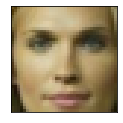

AE


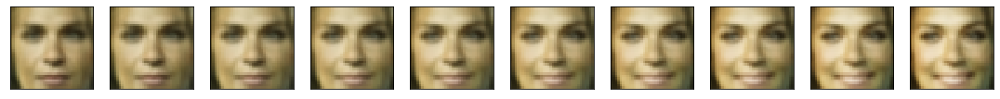

VAE


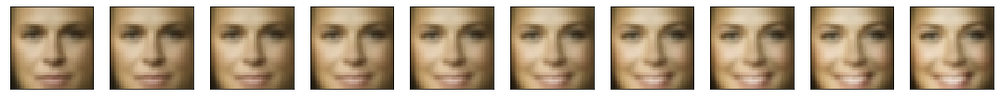

In [ ]:
model_names = ['AE', 'VAE']
points = 10

target_image = X_train[smiling_idx[3000]][np.newaxis, :]
print('Target image:')
plot_gallery(target_image, image_h, image_w, n_row=1, n_col=1)

for model, name in zip([autoencoder, vae], model_names):
    print(name)
    model.eval()
    smiling_lc = encode(model, smiling_images)
    nonsmiling_lc = encode(model, nonsmiling_images)
    target_lc = encode(model, target_image)

    steps_lc = latent_interpolation(nonsmiling_lc, smiling_lc, target_lc, points)
    steps_target = [decode(model, step_lc) for step_lc in steps_lc]

    plot_gallery(steps_target, image_h, image_w, n_row=1, n_col=points)

# Part 4. Generative Adversarial Networks (GANs) — 15 points

## Links

- https://en.wikipedia.org/wiki/Generative_adversarial_network
- https://towardsdatascience.com/understanding-generative-adversarial-networks-gans-cd6e4651a29

## Theory

### Intro

Now we will consider another implicit generative model.

Implicit models (in contrary to explicit VAE), do not provide a direct access to the modeled data distribution $p(x)$, but only allow to sample from it.

Though this may be an advantage rather than a disadvantage. Most of the explicit models have to make assumptions about the shape of the data distribution. For example, in VAEs the assumption is that each image comes from a normal distribution, with each pixel being _independent_ of each other. Needless to say, this model is far from being ideal for modelling the natural images, because we all know that pixels in the image strongly depend not only on their neighbours, but sometimes on the global context as well.

<img src="https://bit.ly/3567LM6" width=320px>

This is why it is hard for us to believe that the image above is real, even though all local patches are perfectly real :)

### Method description

In order to overcome limitations of tracktable families of probabilistic models, we have to go intractable. Currently, Generative Adversarial Networks is the most successful example of such models.

__Key idea__ of GANs is the use of a loss function that is trained from the data.

A good analogy is a counterfeiter vs a cop example:

<img src="https://www.cfml.se/img/blog/generative_adversarial_networks/counterfeiter_vs_cop.jpg" width=640px>

A counterfeiter is a "generator" neural network that is being trained to produce realistic data points (not neccessarily images). A cop is a "discriminator" neural network trained to recognize fake data points. The counterfeiter gets constant updates from the cop via a gradient flow (backpropagation) and tries to maximize the realism score a cop is assigning to fake data points. The cop receives the feedback via the update of the available dataset, and tries to maximize the recognition accuracy.

If we denote $G$ as a generator, with $\hat{x}$ being its output, $D$ as a discriminator and $\mathcal{L}(s, \hat{s})$ as a classification function (with $s$ denoting class scores) the cop would want to minimize (say, binary cross entropy), then the objective can be written as a zero-sum game (since a classification function is typically symmetric w.r.t. classes): 

$$
    \max_G \min_D \mathcal{L} \big( D(x), D(\hat{x}) \big).
$$

In practice, however, for numerous reasons it is useful to separate this single objective into two, leading to a potentially non-zero sum game:

$$
    \max_G \min_D \mathcal{L}_G \big( D(x), D(\hat{x}) \big) + \mathcal{L}_D ( D(x), D(\hat{x}) \big),
$$

with gradients from the objective $\mathcal{L}_G$ being back-propagated only into the generator, and $\mathcal{L}_D$ — only into the discriminator.

### Training stability

The objective above is typically optimized via an alternating stochastic gradient descend technique: i.e., we first do an optimization step w.r.t. one network, and then use updated weights to perform a step w.r.t. another network. Although this technique has convergence issues [1], it is still widely used for its simplicity and memory efficiency.

Also, although GANs used to be notoriously hard to train, a number of techniques [2, 3] have been developed to overcome the difficulties.

Still, when we are talking about GANs, it is incorrect to use a term "convergence", because even with the aforementioned techniques, the optimization process does not converge to a state when the loss of the generator converges to zero. On contrary, it is a __red flag__ indicating a __training instability__ if this loss converges to zero. In practice, this means that the generator is fooling the discriminator with garbage.

Ideal training curves look like that:

<img src="https://i.ibb.co/0csVDhH/gans-training-curves.png" alt="source: https://deepai.org/publication/geogan-a-conditional-gan-with-reconstruction-and-style-loss-to-generate-standard-layer-of-maps-from-satellite-images" width=640px>

Bad training curves look like that:

<img src="https://miro.medium.com/max/2732/1*4A5bo8gVG9wmg-5wtqavOg.png" width=640px>

The weights of both the generator and discriminator keep constantly updating during training, resulting in a typical oscilation behavior [1].

Usually ideal training curves end up like the bad ones if you train long enough — all you can do is taking a checkpoint right before the training collapses (you can see this point clearly on the second plot). If the training process was stable, this collapse happends long after the results have stopped improving, though some models still struggle to obtain stable enough behavior for data with high dimensionality [4].

## Task

Implement and train a generative adversarial network using the provided dataset in 3 variants:

1. with a spectral normalization,
2. with a gradient penalty,
3. without any regularization.

Also try turning on and off batch normalization in the generator network for all approaches. Note that spectral normalization and batch normalization can be used simultaneously, since SN is only applied to linear and convolutional layers.

Visualize the resulting learning curves for all approaches and provide a side-by-side comparison for a small (~10 items) subset of samples for each method. Your learning curves should look similar to the "ideal" curves above.

## Notes

- Use Adam optimizer with $\beta_1 = 0$ for both the generator and the discriminator.
- Start with the learning rate equal to $1 \cdot 10^{-4}$ for both networks. Increase the learning rate by a factor of 4 for the discriminator, when using spectral normalization.
- Use PyTorch implementation of spectral normalization (__torch.nn.utils.SpectralNorm__). Implement a gradient penalty by hand using the following equations and __torch.autograd.grad__ (pass discriminator outputs to _outputs_, inputs to _inputs_, and ones to grad_outputs, set _retain_graph_ to True):


$$
    \mathcal{L}_\text{GP} = 10 \cdot \mathbb{E}_{x \sim p(x)} (||\nabla_x D(x)||_2 - 1)^2
$$

- Use hinge loss for training, but feel free to experiment with other losses as well for bonus points.

\begin{aligned}
    & \mathcal{L}_D = \mathbb{E}_{x \sim p(x)}\, \text{min}\big( 0, 1 - D(x) \big) + \mathbb{E}_{z \sim p(z)}\, \text{min}\big( 0, 1 + D(G(z)) \big) \\
    & \mathcal{L}_G = - \mathbb{E}_{z \sim p(z)}\, D(G(z))
\end{aligned}

## References

[1] Mescheder et. al., "Which Training Methods for GANs do actually Converge?", ICML 2018, https://arxiv.org/abs/1801.04406

[2] Miyato et. al., "Spectral Normalization for Generative Adversarial Networks", ICLR 2018, https://arxiv.org/abs/1802.05957

[3] Gulrajani et. al., "Improved Training of Wasserstein GANs", NeurIPS 2017, https://arxiv.org/abs/1704.00028

[4] Brock et. al., "Large Scale GAN Training for High Fidelity Natural Image Synthesis", ICLR 2018, https://arxiv.org/abs/1809.11096

In [ ]:
#@title Utility functions
import numpy as np
import os
import skimage.io
import skimage
import skimage.transform
import pandas as pd

def fetch_lfw_dataset(attrs_name = "lfw_attributes.txt",
                      images_name = "lfw-deepfunneled",
                      raw_images_name = "lfw",
                      use_raw=False,
                      dx=80,dy=80,
                      dimx=45,dimy=45
    ): # sad smile

    #download if not exists
    if (not use_raw) and not os.path.exists(images_name):
        print("images not found, donwloading...")
        os.system("wget http://vis-www.cs.umass.edu/lfw/lfw-deepfunneled.tgz -O tmp.tgz")
        print("extracting...")
        os.system("tar xvzf tmp.tgz && rm tmp.tgz")
        print("done")
        assert os.path.exists(images_name)
    
    if use_raw and not os.path.exists(raw_images_name):
        print("images not found, donwloading...")
        os.system("wget http://vis-www.cs.umass.edu/lfw/lfw.tgz -O tmp.tgz")
        print("extracting...")
        os.system("tar xvzf tmp.tgz && rm tmp.tgz")
        print("done")
        assert os.path.exists(raw_images_name)

    if not os.path.exists(attrs_name):
        print("attributes not found, downloading...")
        os.system("wget http://www.cs.columbia.edu/CAVE/databases/pubfig/download/%s" % attrs_name)
        print("done")

    #read attrs
    df_attrs = pd.read_csv("lfw_attributes.txt",sep='\t',skiprows=1,) 
    df_attrs = pd.DataFrame(df_attrs.iloc[:,:-1].values, columns = df_attrs.columns[1:])


    #read photos
    dirname = raw_images_name if use_raw else images_name
    photo_ids = []
    for dirpath, dirnames, filenames in os.walk(dirname):
        for fname in filenames:
            if fname.endswith(".jpg"):
                fpath = os.path.join(dirpath,fname)
                photo_id = fname[:-4].replace('_',' ').split()
                person_id = ' '.join(photo_id[:-1])
                photo_number = int(photo_id[-1])
                photo_ids.append({'person':person_id,'imagenum':photo_number,'photo_path':fpath})

    photo_ids = pd.DataFrame(photo_ids)

    #mass-merge
    #(photos now have same order as attributes)
    df_attrs['imagenum'] = df_attrs['imagenum'].astype(np.int64)
    df = pd.merge(df_attrs, photo_ids, on=('person','imagenum'))

    assert len(df)==len(df_attrs),"lost some data when merging dataframes"

    #image preprocessing
    all_photos = df['photo_path'].apply(lambda img: skimage.io.imread(img))\
                                 .apply(lambda img:img[dy:-dy,dx:-dx])\
                                 .apply(lambda img: skimage.img_as_ubyte(skimage.transform.resize(img,[dimx,dimy])))

    all_photos = np.stack(all_photos.values).astype('uint8')
    all_attrs = df.drop(["photo_path","person","imagenum"],axis=1)
    
    return all_photos, all_attrs

images not found, donwloading...
extracting...
done
attributes not found, downloading...
done


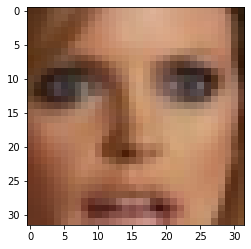

In [ ]:
import pickle
from time import time
from IPython.display import clear_output

import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
plt.rcParams.update({'axes.titlesize': 'small'})


# The following line fetches you two datasets: images, usable for autoencoder training and attributes.
# Those attributes will be required for the final part of the assignment (applying smiles), so please keep them in mind
data, attrs = fetch_lfw_dataset(dimx=32, dimy=32)

# Preprocess faces
data = np.float32(data).transpose([0, 3, 1, 2]) / 127.5 - 1.0

IMG_SHAPE = data.shape[1:]

# Print random image
plt.imshow(((data[np.random.randint(data.shape[0])] + 1) / 2.0).transpose([1, 2, 0]),
           cmap="gray", interpolation="none")

In [ ]:
import torch, torch.nn as nn
import torch.nn.functional as F
from torch.optim import Adam
from torch.nn.utils import spectral_norm

use_cuda = torch.cuda.is_available()
RANDOM_STATE = 42

print("Torch version:", torch.__version__)
if use_cuda:
    print("Using GPU")
else:
    print("Not using GPU")

Torch version: 1.5.0+cu101
Using GPU


In [ ]:
def sample_noise_batch(batch_size):
    noise = torch.randn(batch_size, CODE_SIZE)
    return noise.cuda() if use_cuda else noise.cpu()

class Reshape(nn.Module):
    def __init__(self, shape):
        nn.Module.__init__(self)
        self.shape=shape
    def forward(self,input):
        return input.view(self.shape)

### Generator

Example generator architecture is provided below: use it as a reference for you architectures, but feel free to experiment. If your experiments are shown to improve over baseline performance, you will be rewarded with bonus points.

In our realization, please insert batch normalization before nonlinearities.

In [ ]:
CODE_SIZE = 256

from itertools import count
# automatic layer name maker. Don't do this in production :)
ix = ('layer_%i'%i for i in count())


class SpectralLinear(nn.Module):
    def __init__(self, *args, **kwargs):
        super().__init__()

        self.linear = nn.Linear(*args, **kwargs)
        self.is_spectral = True

    def forward(self, x):
        return self.linear(x)

    def normalize(self):
        self.linear = spectral_norm(self.linear)


class SpectralConv2d(nn.Module):
    def __init__(self, *args, **kwargs):
        super().__init__()

        self.conv = nn.Conv2d(*args, **kwargs)
        self.is_spectral = True

    def forward(self, x):
        return self.conv(x)

    def normalize(self):
        self.conv = spectral_norm(self.conv)


get_generator = lambda: nn.Sequential(nn.Linear(CODE_SIZE, 256 * 4 * 4 ),
                                      Reshape([-1, 256, 4, 4]),
                                      nn.ConvTranspose2d(256, 128, kernel_size=3, stride=2, padding=1, output_padding=1),
                                      nn.LeakyReLU(0.2),
                                      nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2, padding=1, output_padding=1),
                                      nn.LeakyReLU(0.2),
                                      nn.ConvTranspose2d(64, 32, kernel_size=3, stride=2, padding=1, output_padding=1),
                                      nn.LeakyReLU(0.2),
                                      nn.Conv2d(32, 3, kernel_size=3, padding=1),
                                      nn.Tanh()
                                    )

In [ ]:
generator = get_generator()
if use_cuda: generator.cuda()

generated_data = generator(sample_noise_batch(5))
assert tuple(generated_data.shape)[1:] == IMG_SHAPE, "generator must output an image of shape %s, but instead it produces %s" % (IMG_SHAPE,generated_data.shape)

### Discriminator
Discriminator is your usual convolutional network with interlooping convolution and pooling layers

The network does not include dropout/batchnorm to avoid learning complications.

The convolutional part of the discriminator should mirror the generator (with the exception of the first and the last layers).

In [ ]:
def sample_data_batch(batch_size):
    idxs = np.random.choice(np.arange(data.shape[0]), size=batch_size)
    batch = torch.tensor(data[idxs], dtype=torch.float32)
    return batch.cuda() if use_cuda else batch.cpu()

# a special module that converts [batch, channel, w, h] to [batch, units]
class Flatten(nn.Module):
    def forward(self, input):
        return input.reshape(input.shape[0], -1)

In [ ]:
data.shape

(13143, 3, 32, 32)

In [ ]:
### YOUR CODE - create convolutional architecture for discriminator
### Note: please start simple. A few convolutions & poolings would do, inception/resnet is an overkill

# discriminator.add_module("disc_logit", nn.Linear(<???>, 1))

get_discriminator = lambda: nn.Sequential(nn.Conv2d(3, 16, 3, stride=2, padding=1),
                                          nn.ReLU(),
                                          #nn.MaxPool2d(2),

                                          nn.Conv2d(16, 32, 3, stride=2, padding=1),
                                          nn.ReLU(),
                                          #nn.MaxPool2d(2),

                                          nn.Conv2d(32, 32, 3, stride=2, padding=1),
                                          nn.ReLU(),
                                          #nn.MaxPool2d(2),

                                          Flatten(),
                                          nn.Linear(32 * 4 * 4, 32),
                                          nn.BatchNorm1d(32),
                                          nn.ReLU(),

                                          #nn.Linear(256, 32),
                                          #nn.BatchNorm1d(32),
                                          #nn.ReLU(),

                                          nn.Linear(32, 1),
                                          nn.Sigmoid()
                                        )

In [ ]:
discriminator = get_discriminator()
if use_cuda: discriminator.cuda()
discriminator(sample_data_batch(5))

tensor([[0.3166],
        [0.5127],
        [0.3820],
        [0.4122],
        [0.4536]], device='cuda:0', grad_fn=<SigmoidBackward>)

In [ ]:
# YOUR TRAINING CODE HERE

In [ ]:
def generator_step(generator, discriminator, optimizer, batch_size):
    sampled_noise = sample_noise_batch(batch_size)

    fake_data = generator(sampled_noise)

    dis_fake = discriminator(fake_data)
    true_answers = torch.ones_like(dis_fake)

    loss = F.binary_cross_entropy(dis_fake, true_answers)

    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    return loss.item()


def discriminator_step(generator, discriminator, optimizer, batch_size):
    sampled_data = sample_data_batch(batch_size)
    sampled_noise = sample_noise_batch(batch_size)

    fake_data = generator(sampled_noise)

    dis_true = discriminator(sampled_data)
    true_answers = torch.ones_like(dis_true)

    dis_fake = discriminator(fake_data)
    fake_answers = torch.zeros_like(dis_fake)

    loss = (F.binary_cross_entropy(dis_true, true_answers) + 
            F.binary_cross_entropy(dis_fake, fake_answers)) / 2

    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    return loss.item()


def train_gan(epochs, generator, discriminator, gen_optimizer, dis_optimizer, batch_size,
              scheduler=None, verbose=True, save_dir=None, log_file=None, label='model', 
              plot=False, plot_freq=1):

    losses = {'generator': [], 'discriminator': []}

    for epoch in range(1, epochs+1):
        if plot and (epoch % plot_freq == 0):

            clear_output(wait=True)
        t = time()

        dis_loss = discriminator_step(generator, discriminator, dis_optimizer, batch_size)
        gen_loss = generator_step(generator, discriminator, gen_optimizer, batch_size)

        losses['generator'].append(gen_loss)
        losses['discriminator'].append(dis_loss)

        if scheduler is not None:
            scheduler.step()

        log_line =  f'{epoch}/{epochs} | ' + \
                    f'Gen loss {gen_loss:.4f} | ' + \
                    f'Dis loss {dis_loss:.4f} | {time()-t:.1f} sec'

        if save_dir:
            path_to_gen = os.path.join(save_dir, f'gen_{label}.pth')
            path_to_dis = os.path.join(save_dir, f'dis_{label}.pth')
            path_to_losses = os.path.join(save_dir, f'losses_{label}.pkl')

            torch.save(generator.state_dict(), path_to_gen)
            torch.save(discriminator.state_dict(), path_to_dis)

            pickle.dump(losses, open(path_to_losses, 'wb'))

        if verbose:
            print(log_line)

        if log_file:
            with open(log_file, 'a') as f:
                f.write(log_line + '\n')

        if plot and (epoch % plot_freq == 0):
            plot_faces(generator, 1, 12)
            plot_gan_losses(losses)

    return losses

In [ ]:
def plot_gallery(images, h, w, n_row=3, n_col=6):
    """Helper function to plot a gallery of portraits"""
    plt.figure(figsize=(1.5 * n_col, 1.7 * n_row))
    plt.subplots_adjust(bottom=0, left=.01, right=.99, top=.90, hspace=.35)
    images = (images + 1) / 2
    for i in range(n_row * n_col):
        plt.subplot(n_row, n_col, i + 1)
        plt.imshow(images[i].reshape((h, w, 3)), cmap=plt.cm.gray, vmin=0, vmax=1, interpolation='nearest')
        plt.xticks(())
        plt.yticks(())

    plt.show()


def plot_faces(generator, n_row, n_col):
    sampled_noise = sample_noise_batch(n_row*n_col)
    fake_data = generator(sampled_noise)

    fake_data = fake_data.transpose(1, 3).transpose(1, 2).reshape(n_row*n_col, 32*32*3)
    fake_data = fake_data.cpu().detach().numpy()

    plot_gallery(fake_data, 32, 32, n_row, n_col)


def plot_gan_losses(losses, figsize=(22, 10)):
    fig, axis = plt.subplots(2, 1, figsize=figsize)

    axis[0].plot(losses['generator'], 'b')
    axis[1].plot(losses['discriminator'], 'g')

    axis[1].set_xlabel('n_epoch', fontsize=14)
    axis[0].set_title('Generator loss', fontsize=16)
    axis[1].set_title('Discriminator loss', fontsize=16)

    axis[0].grid()
    axis[1].grid()

    plt.show()

In [ ]:
PATH_TO_GANS = os.path.join(AUX_DATA_ROOT, 'models', 'gan')
os.makedirs(PATH_TO_GANS, exist_ok=True)

DO_TRAIN = True

In [ ]:
torch.manual_seed(RANDOM_STATE)

label = 'without_reg_5'

generator = get_generator()
discriminator = get_discriminator()

if use_cuda:
    generator.cuda()
    discriminator.cuda()

gen_optimizer = Adam(generator.parameters(), lr=1e-4, betas=(0, 0.999))
dis_optimizer = Adam(discriminator.parameters(), lr=1e-4, betas=(0, 0.999))

epochs = 30000
batch_size = 128

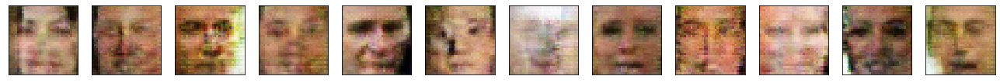

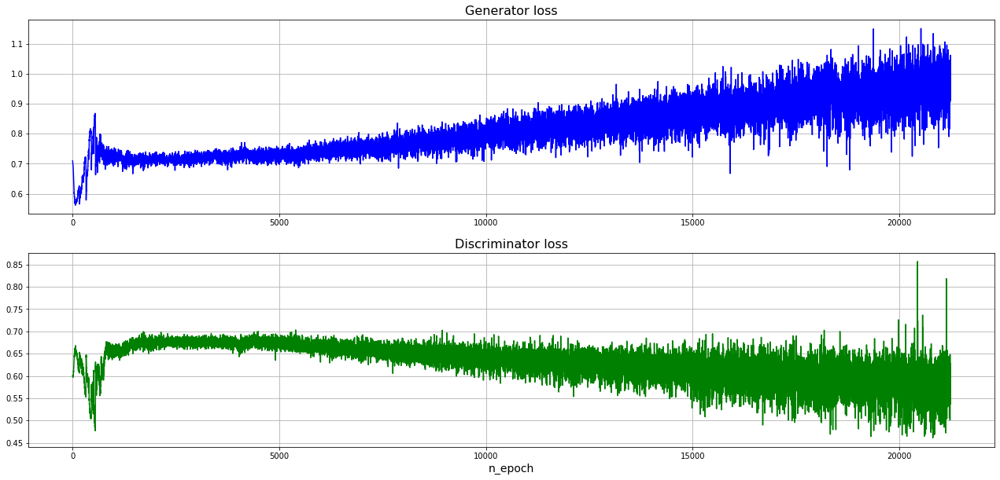

In [ ]:
%%time
if DO_TRAIN:
    losses = train_gan(epochs, generator, discriminator, gen_optimizer, dis_optimizer, batch_size,
                       verbose=False, save_dir=PATH_TO_GANS, label=label, plot=True, plot_freq=20)

without_reg_5


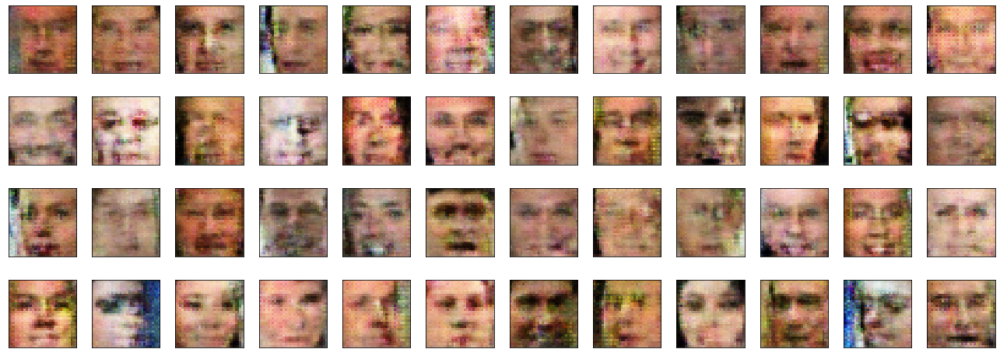

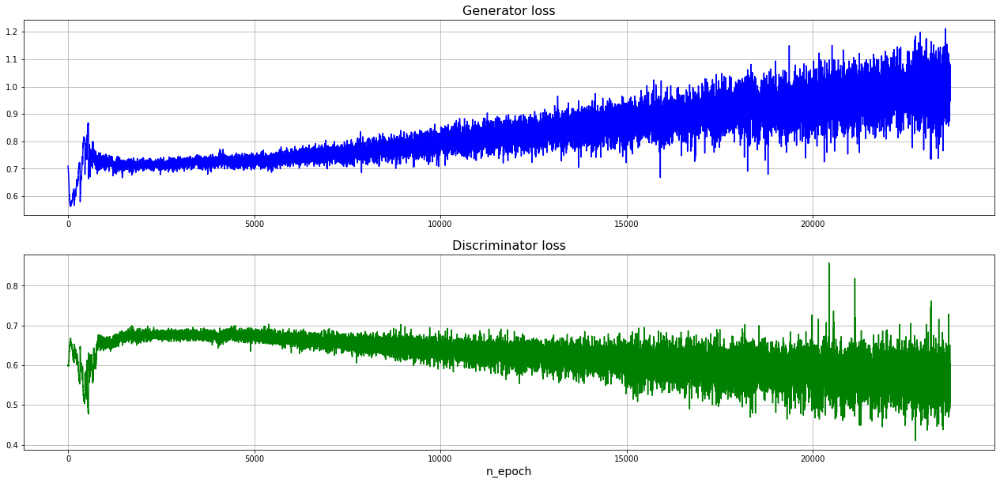

In [ ]:
labels = ['without_reg_5']

for label in labels:
    
    gen_params = torch.load(os.path.join(PATH_TO_GANS, f'gen_{label}.pth'))
    generator = get_generator()
    generator.load_state_dict(gen_params)

    dis_params = torch.load(os.path.join(PATH_TO_GANS, f'dis_{label}.pth'))
    discriminator = get_discriminator()
    discriminator.load_state_dict(dis_params)

    if use_cuda: generator.cuda()

    losses = pickle.load(open(os.path.join(PATH_TO_GANS, f'losses_{label}.pkl'), 'rb'))
    print(label)
    plot_faces(generator, 4, 12)
    plot_gan_losses(losses)